## Import Libraries

In [1]:
# for operations on data
import numpy as np
import pandas as pd
# for visualisation of data
import seaborn as sns
import matplotlib.pyplot as plt
# for making connection with database
import pyodbc
import pymssql
# for time
from datetime import datetime
# for making widgets
import ipywidgets as widgets
from IPython.display import display
# for statistical processing
from scipy import stats

In [2]:
import plotly
import io
import base64
import json
import plotly.express as px

## Import Helper Functions

In [3]:
# contains helping functions
from helper import *
# contains functions to make connection with database
from connector import *
# contains functions to read data from database
from tableReader import *
# contains classes to carry-out calculations
from companion import *

## Connect to the Database

In [4]:
#################### Connection with Manual Login Details via pyodbc ########################
# conn = connect_manual_via_pyodbc() # from connector.py
    
############################# Default Connection via pyodbc ################################
conn = connect_default_via_pyodbc() # from connector.py   


#################### Connection with Manual Login Details via pymssql ########################
# conn = connect_manual_via_pymssql() # from connector.py
    
############################# Default Connection via pymssql ################################
# conn = connect_default_via_pymssql() # from connector.py  

 
Successfully Connected to the Database


## Choose Time Interval

In [5]:
# choose time period via dropdown
vis, mo, choosen_y, choosen_m, choosen_q, sd, ed = choose_period() # from helper.py

(For visualisation w.r.t. Month/Quarter enter 1, else enter 2)  1


Dropdown(description='Year:', index=5, options=(('2016', '2016'), ('2017', '2017'), ('2018', '2018'), ('2019',…

Enter 1 to choose months and 2 for Quarters: 1


Dropdown(description='Month:', options=(('January', '01'), ('February', '02'), ('March', '03'), ('April', '04'…

In [6]:
# generate start & end dates corresponding to choosen period
start_date, end_date = choose_start_end_date(vis, mo, choosen_y, choosen_m, choosen_q, sd, ed) # from helper.py

Choosen Start Date is: 2021-09-01 00:00:00
Choosen End Date is: 2021-09-30 00:00:00


###############################################################################################################################

## Related to my Dimensions
#### *Done*
1) [No of session] vs [time taken till submission]
2) Distribution of practice session course wise & subject wise  
3) Avg Practice Session time course wise & subject wise  
4) No of questions used course wise & subject wise   
5) No of unique questions used course wise & subject wise  
6) No of unique users course wise & subject wise  


#### *Remaining*  
7) Total time spent course wise & subject wise  
13) Avg no of questions per practice session course wise & subject wise  



## Related to Other Dimensions
#### *Done*
10) Total KSC Count course wise & subject wise 
9) Total Question Count course wise & subject wise 


#### *Remaining*
8) Reported Errors course wise & subject wise
11) New Ques Added (as per date filter) course wise & subject wise  
12) New KSC Added (as per date filter) course wise & subject wise  
15) No of questions having less than 15% accuracy course wise & subject wise  
14) Previous Year Ques Count course wise & subject wise  

###############################################################################################################################

# 1. Assignment Practice Session Usage (from Exam tables)
Exam tables contain the data related to Assignments solved by users

In [7]:
AU = Assignment_Usage(conn, start_date, end_date)

Length of data is: 40575


,index,ExamSessionQuestionId,ExamSessionId,QuestionId,StartedOn,CompletedOn,TotalTimeTaken,ExamId,UserId,CourseId,AffiliationCodeId,RoleId,_SubjectId,CourseName,SubjectName
0,0,293148,37189,99773,2021-09-28 10:00:53.713,2021-09-28 10:01:24.647,31,289459,73527,2,935,2,2,9/10 CBSE,Maths
1,1,278808,35524,159432,2021-09-17 19:22:14.403,2021-09-17 19:23:10.923,56,323159,70132,4,321,2,8,11/12 CBSE,Biology
2,2,262147,33936,15770,2021-09-05 18:18:05.377,2021-09-05 18:18:07.443,2,379781,83124,1,1125,2,2,JEE,Maths
3,3,262703,33970,200085,2021-09-05 20:12:36.517,2021-09-05 20:12:41.827,5,570045,83124,1,1125,2,1,JEE,Physics
4,4,262700,33970,114358,2021-09-05 20:12:00.340,2021-09-05 20:12:12.490,12,570045,83124,1,1125,2,1,JEE,Physics


## Histogram of practice session time

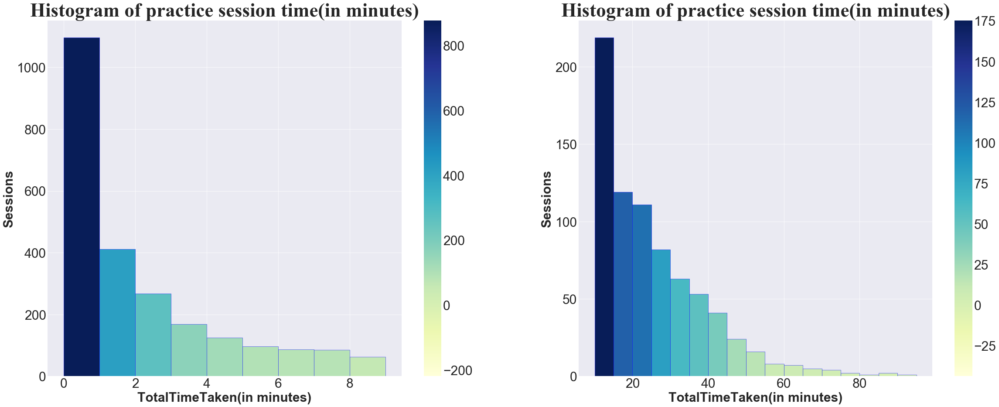

In [8]:
au1 = AU.practice_session_time_histogram_range_split()

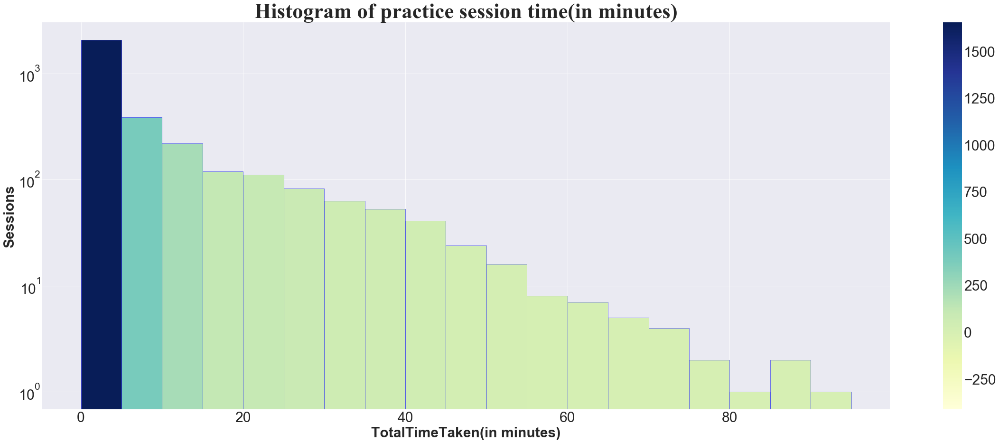

In [9]:
au2 = AU.practice_session_time_histogram_logscale()

## Distribution of practice sessions course-wise and subject-wise (Heat Map)

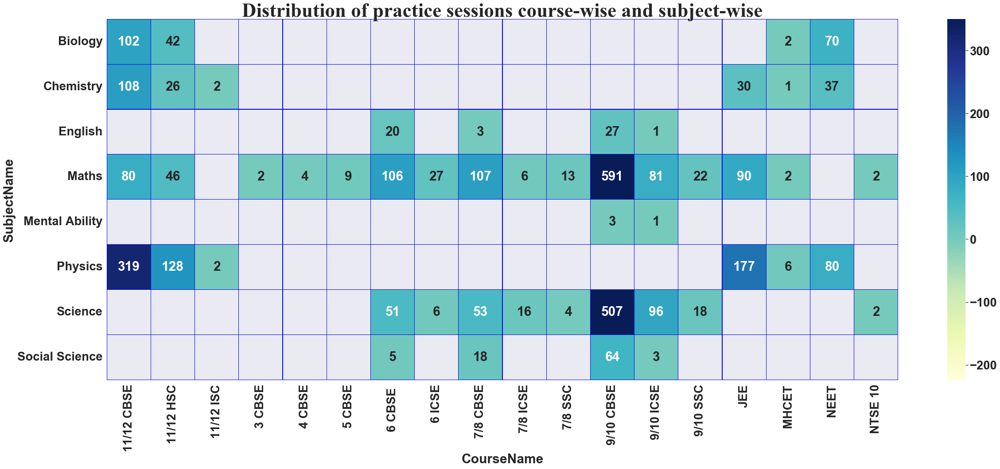

In [10]:
au3 = AU.cwsw_practice_session_heatmap()

## Average Practice session time course-wise subject-wise (Heat Map)

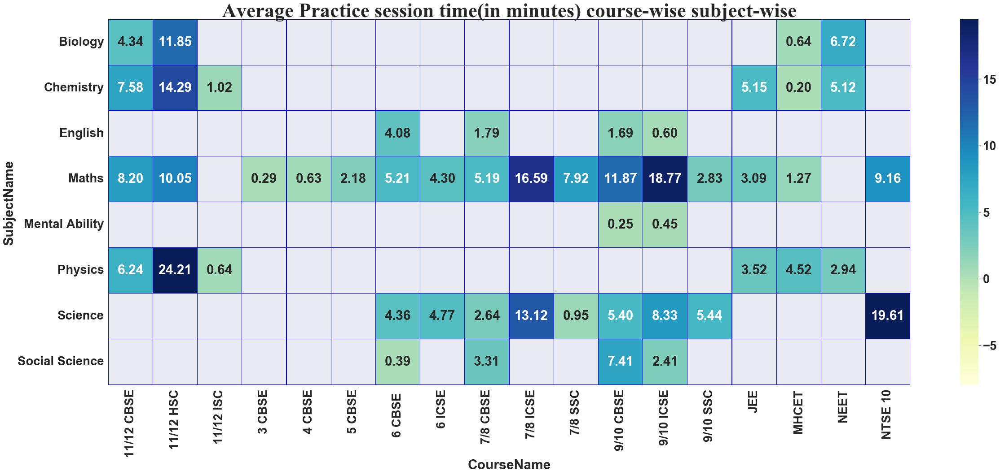

In [11]:
au4 = AU.cwsw_avg_practice_session_time_heatmap()

## Number of questions used subject wise and course-wise (Heat Map)

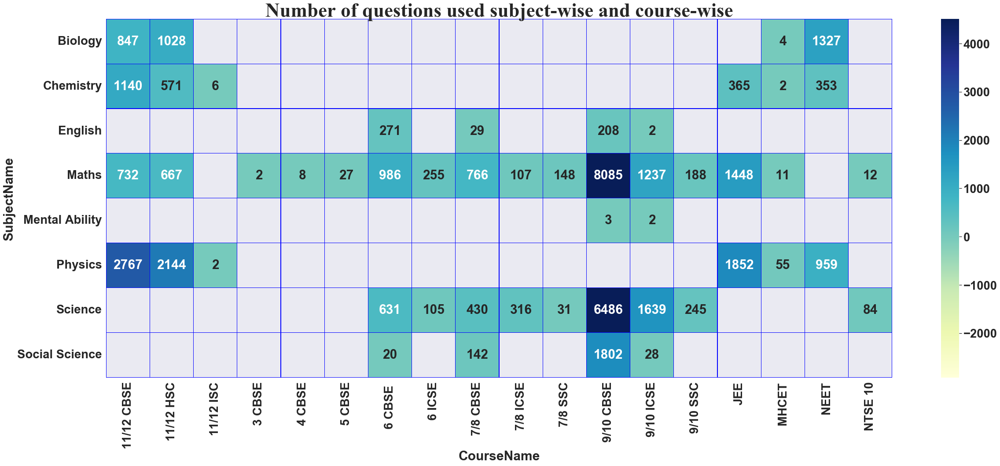

In [12]:
au5 = AU.cwsw_questions_used_heatmap()

## Number of unique questions used subject wise and course-wise (Heat Map)

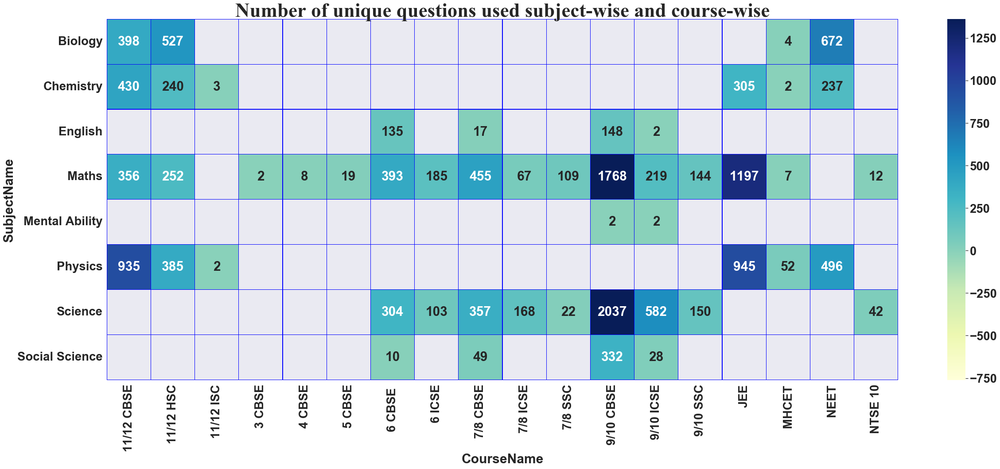

In [13]:
au6 = AU.cwsw_unique_questions_used_heatmap()

## Number of unique users subject-wise and course-wise

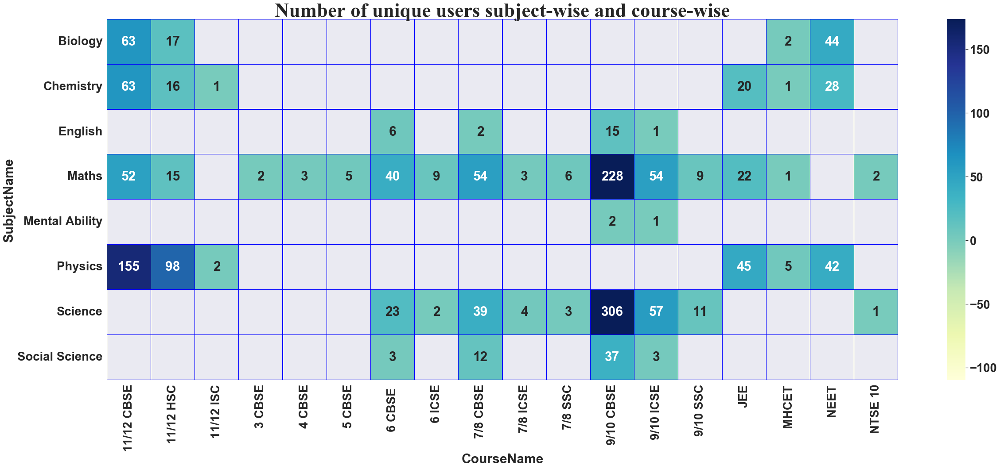

In [14]:
au7 = AU.cwsw_unique_users_heatmap()

## Total time spent course wise & subject wise (Heatmap)

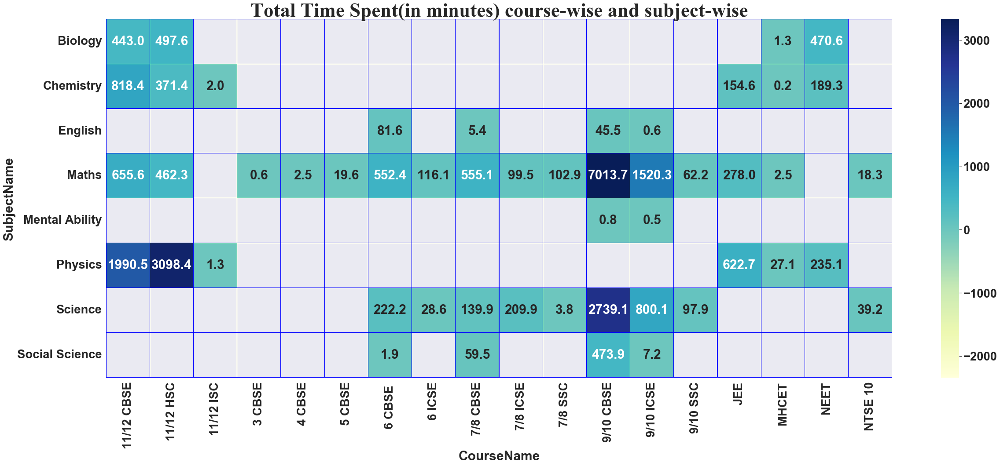

In [15]:
au8 = AU.cwsw_total_time_spent_heatmap()

## Avg no of questions per practice session course wise & subject wise (Heatmap)

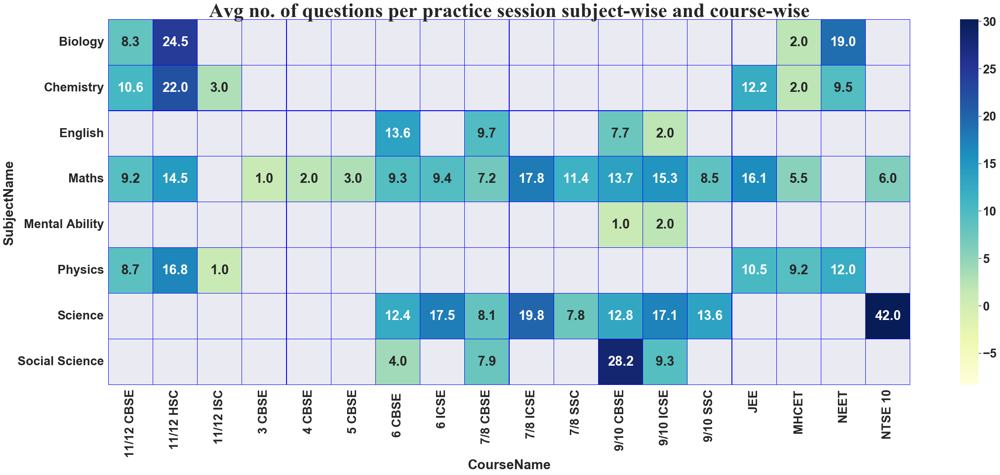

In [16]:
au9 = AU.cwsw_questions_per_practice_session_heatmap()

# 2. Self-Test Practice Session Usage(from UserTest tables)
UserTest tables contain the data related to self-tests taken by users

In [17]:
PS = Practice_Session_Usage(conn, start_date, end_date)

Length of data is: 2054206


,index,UserTestSessionId,UserId,QuestionId,IsAttempted,TimeTakenTillSubmission,StartedOn,CompletedOn,AttemptedOn,CourseId,SubjectId,AffiliationCodeId,CenterCodeId,RoleId,CourseName,SubjectName
0,0,552668,132833,29615,1,5,2021-09-01 00:54:36.247,2021-09-01 00:54:45.977,2021-09-01 00:54:41.857,1,1,1814,7772,2,JEE,Physics
1,1,550867,105219,109033,1,3,2021-09-01 00:20:45.297,2021-09-01 00:21:51.633,2021-09-01 00:20:48.413,6,3,903,3366,2,NEET,Chemistry
2,2,553292,131247,23319,1,88,2021-08-31 23:58:32.547,2021-09-01 00:01:38.400,2021-09-01 00:00:00.020,1,2,1752,7191,2,JEE,Maths
3,3,553293,85577,129273,1,241,2021-08-31 23:58:58.667,2021-09-01 00:03:25.363,2021-09-01 00:02:59.503,1,2,18,8314,2,JEE,Maths
4,4,553287,132565,202852,1,138,2021-08-31 23:59:04.033,2021-09-01 00:01:29.327,2021-09-01 00:01:22.947,4,3,1839,7666,2,11/12 CBSE,Chemistry



## Histogram of practice session time

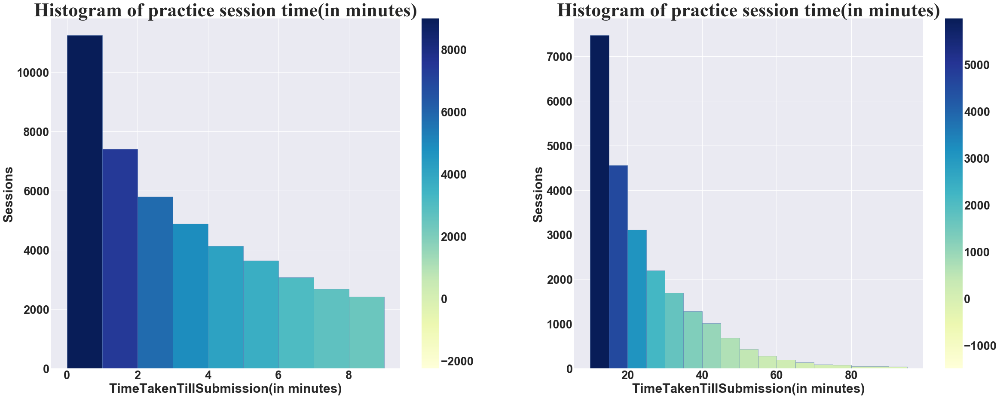

In [18]:
ps1 = PS.practice_session_time_histogram_range_split()

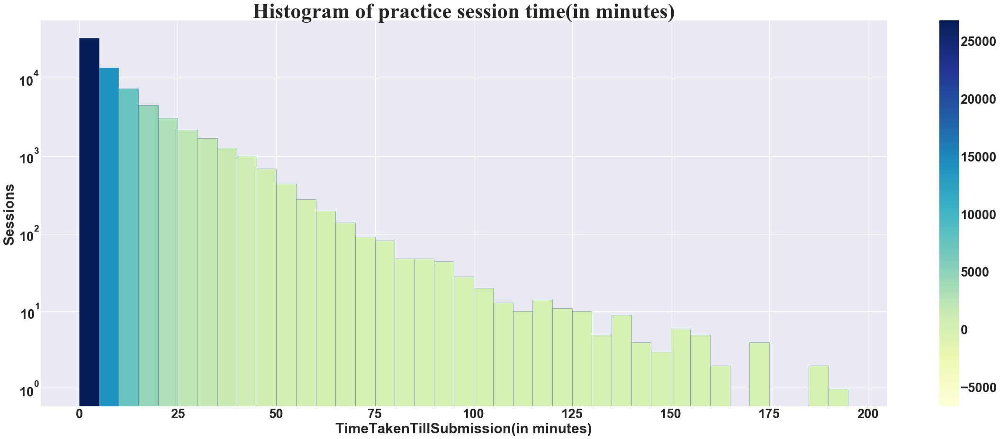

In [19]:
ps2 = PS.practice_session_time_histogram_logscale()

## Distribution of practice sessions course-wise and subject-wise (Heat Map)

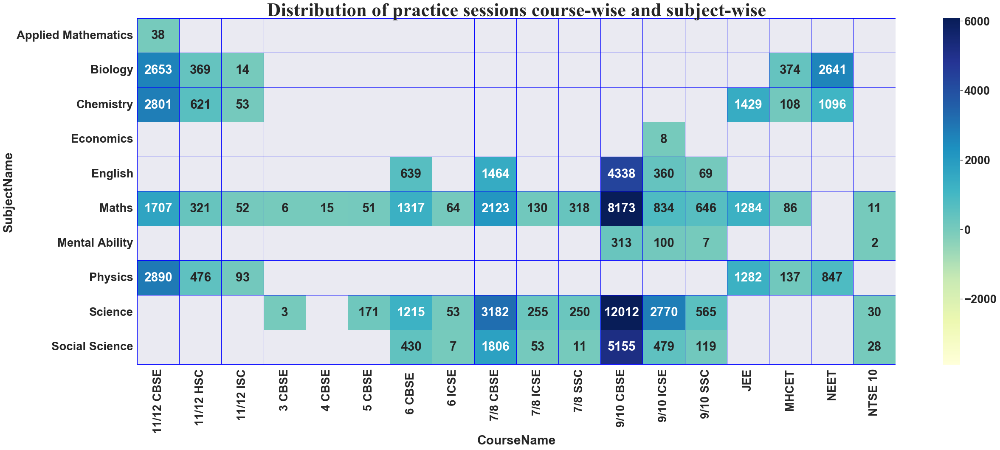

In [20]:
ps3 = PS.cwsw_practice_session_heatmap()

## Average Practice session time course-wise subject-wise (Heat Map)

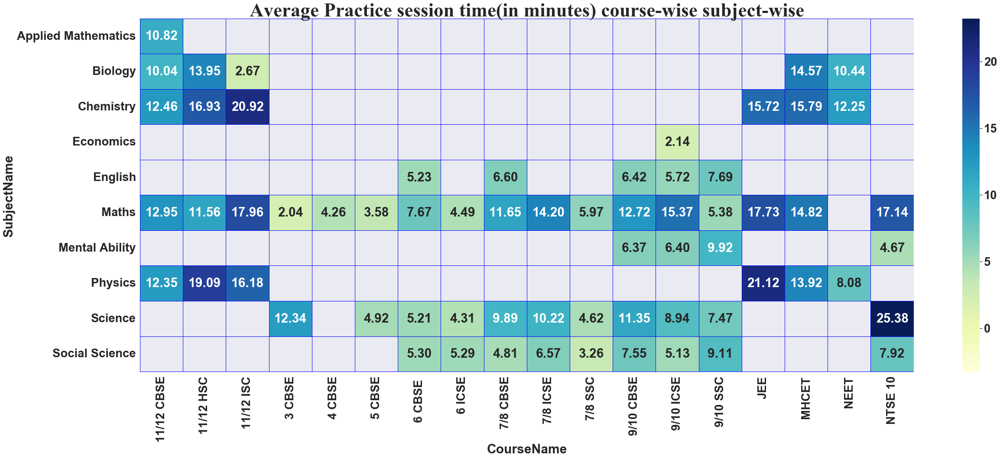

In [21]:
ps4 = PS.cwsw_avg_practice_session_time_heatmap()

## Number of questions used  subject wise and course-wise (Heat Map)

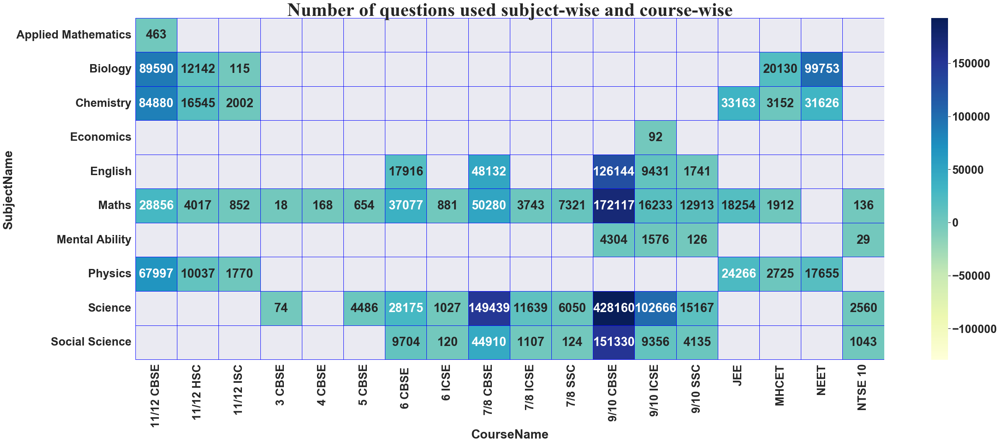

In [22]:
ps5 = PS.cwsw_questions_used_heatmap()

## Number of unique questions used subject wise and course-wise (Heat Map)

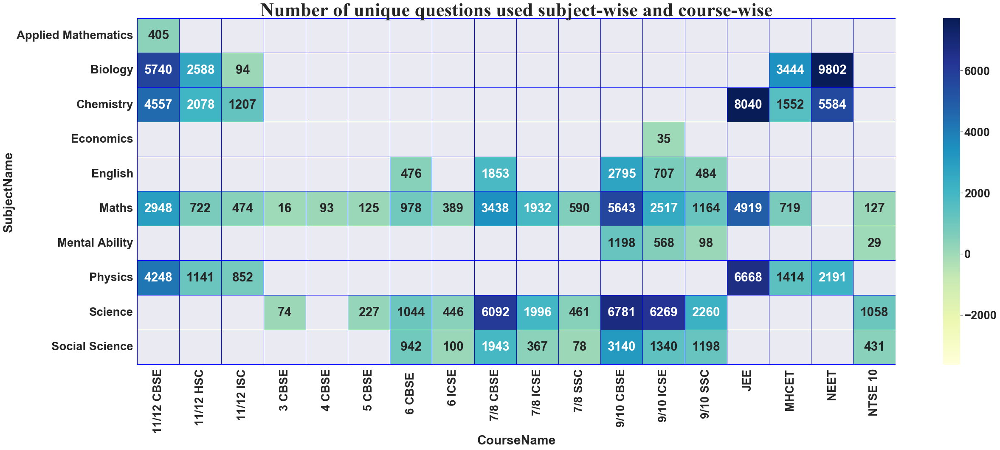

In [23]:
ps6 = PS.cwsw_unique_questions_used_heatmap()

## Number of unique users subject-wise and course-wise

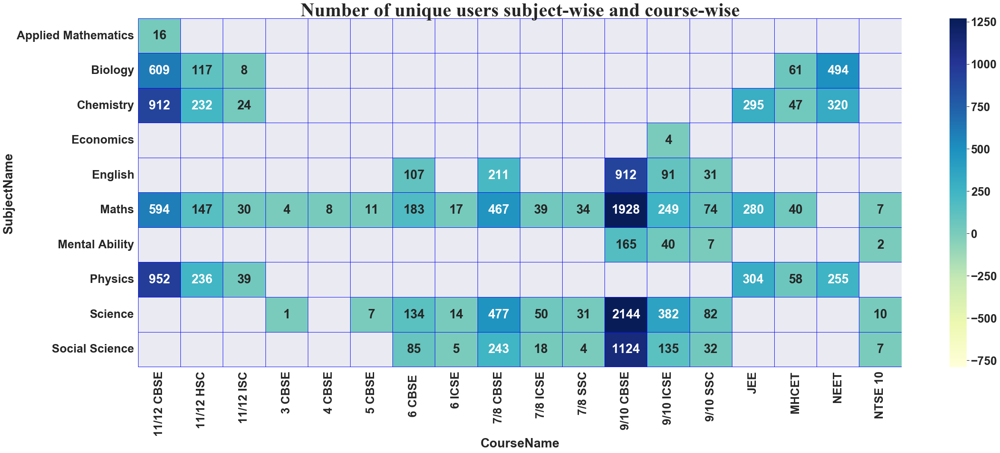

In [24]:
ps7 = PS.cwsw_unique_users_heatmap()

## Total time spent course wise & subject wise (Heatmap) 

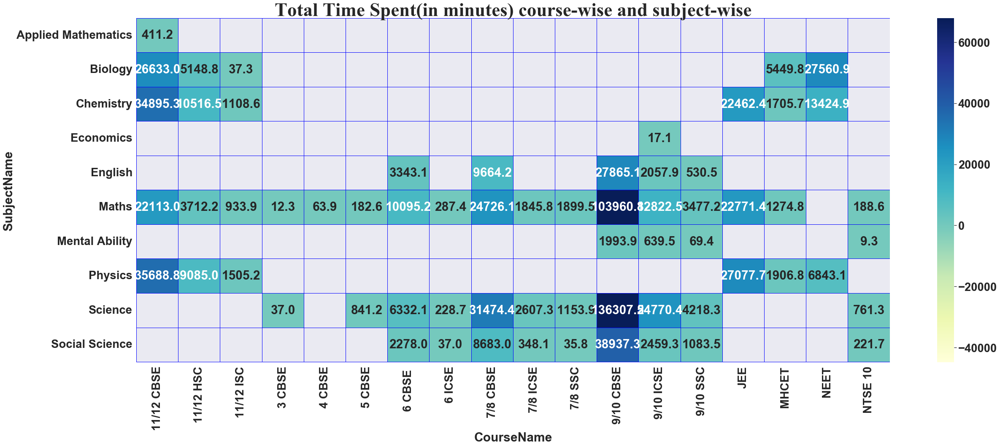

In [25]:
ps8 = PS.cwsw_total_time_spent_heatmap()

## Total time spent course wise & subject wise (Heatmap) 

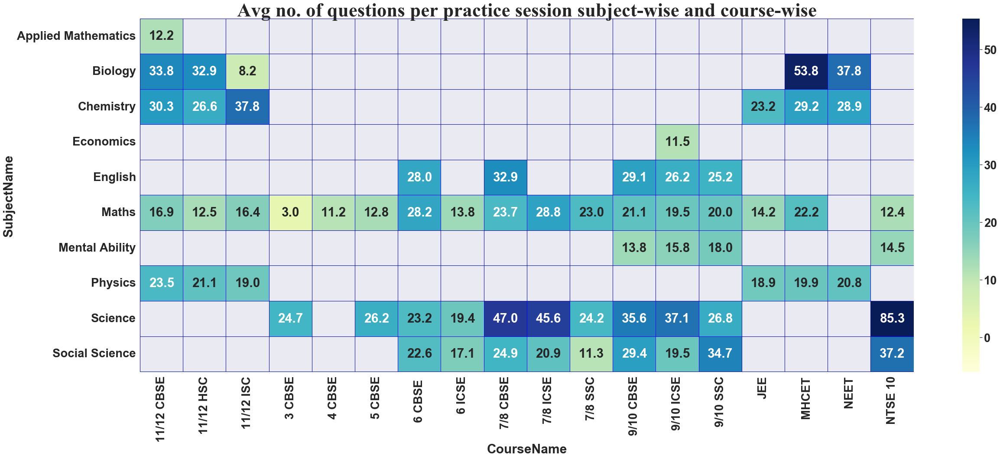

In [26]:
ps9 = PS.cwsw_questions_per_practice_session_heatmap()

# 3. Institute Test Usage

In [27]:
IT = Institute_Test_Usage(conn, start_date, end_date)

Length of data is: 158007


,index,UserId,InstituteTestId,InstituteTestUserId,QuestionId,StartedOn,CompletedOn,TimeTakenInSec,CourseId,AffiliationCodeId,CenterCodeId,RoleId,_SubjectId,CourseName,SubjectName
0,0,94501,15701,1158088,280,2021-09-12 13:33:05.540,2021-09-12 13:34:31.473,86,1,1292,5209,2,1,JEE,Physics
1,1,94502,15013,1133976,284,2021-09-05 11:19:11.770,2021-09-05 11:30:42.950,691,1,1292,5209,2,1,JEE,Physics
2,2,94494,14922,1132291,417,2021-09-04 16:34:15.817,2021-09-04 16:36:46.480,151,1,1292,5208,2,1,JEE,Physics
3,3,84926,14881,1131706,424,2021-09-05 16:02:32.830,2021-09-05 16:03:55.180,82,1,1078,4371,2,1,JEE,Physics
4,4,84928,14881,1131696,424,2021-09-05 16:04:02.490,2021-09-05 16:05:22.147,80,1,1078,4371,2,1,JEE,Physics


## Course-wise test analysis

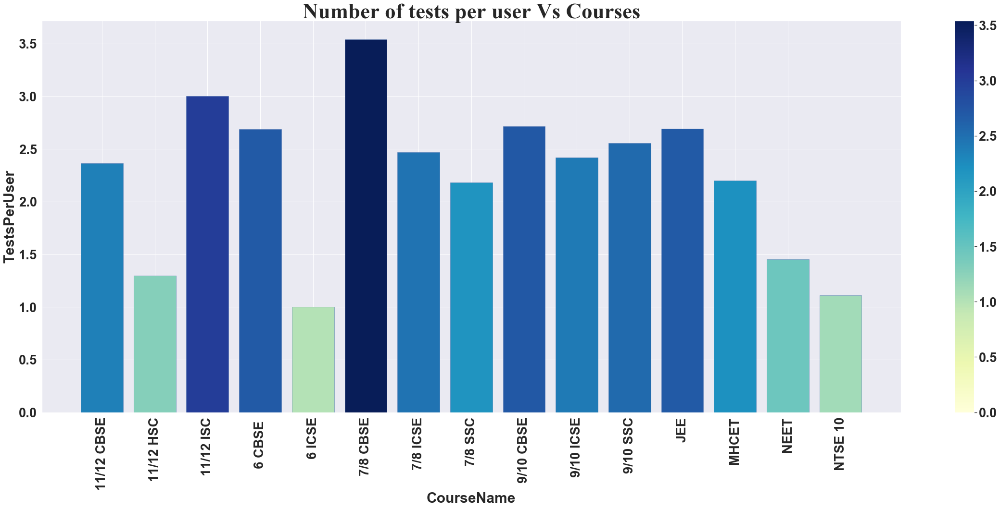

In [28]:
it1 = IT.coursewise_analysis_1()

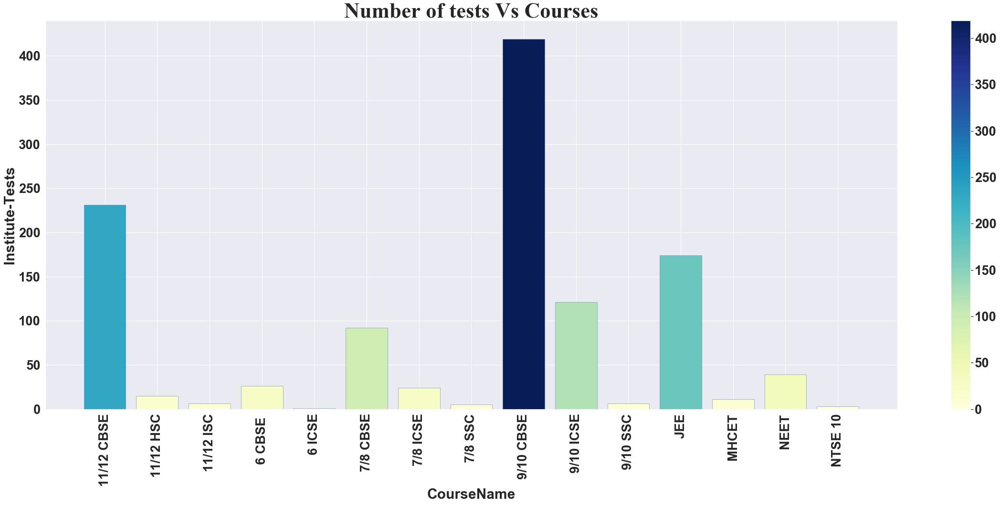

In [29]:
it2 = IT.coursewise_analysis_2()

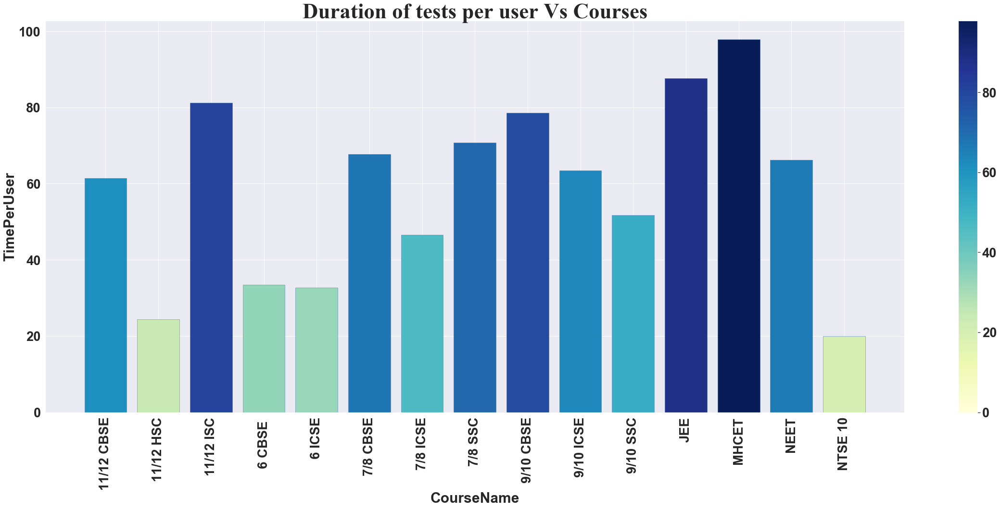

In [30]:
it3 = IT.coursewise_analysis_3()

## Subject-wise test analysis

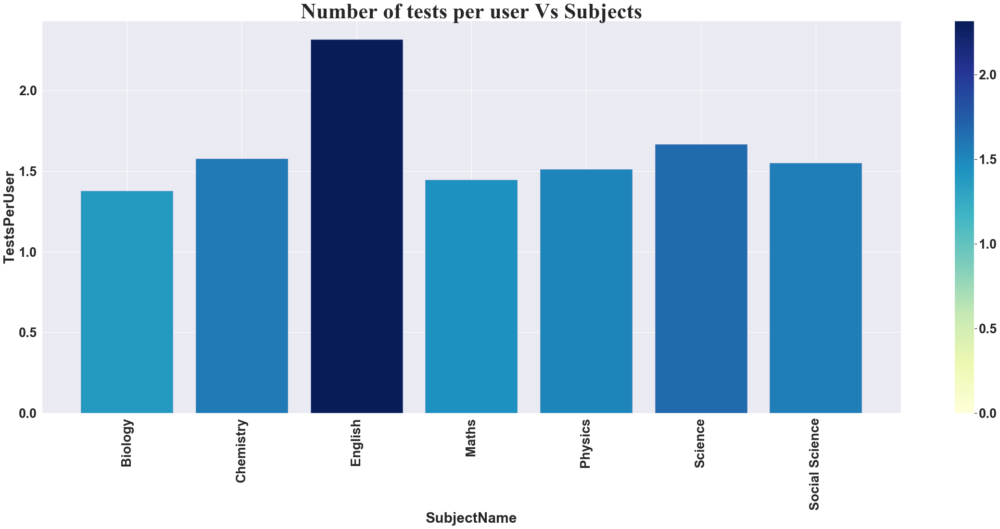

In [31]:
it4 = IT.subjectwise_analysis_1()

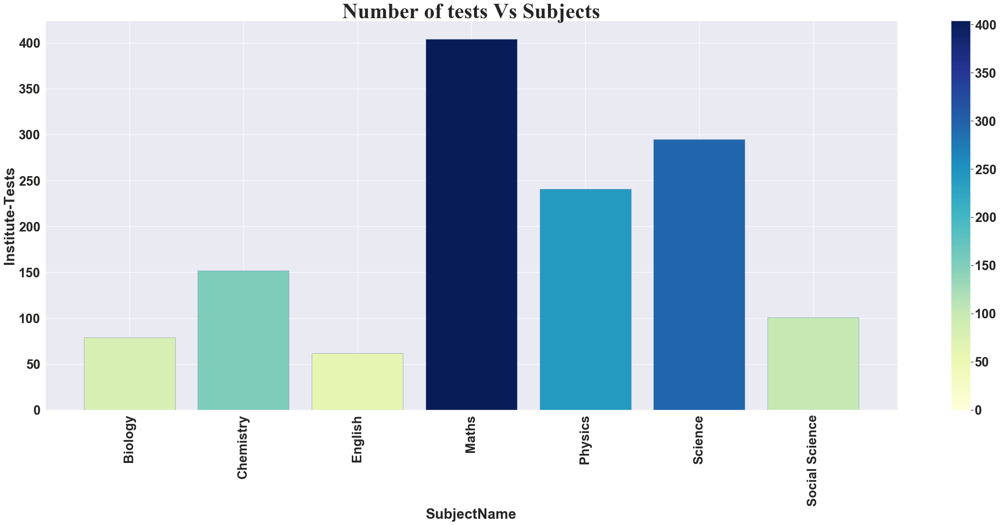

In [32]:
it5 = IT.subjectwise_analysis_2()

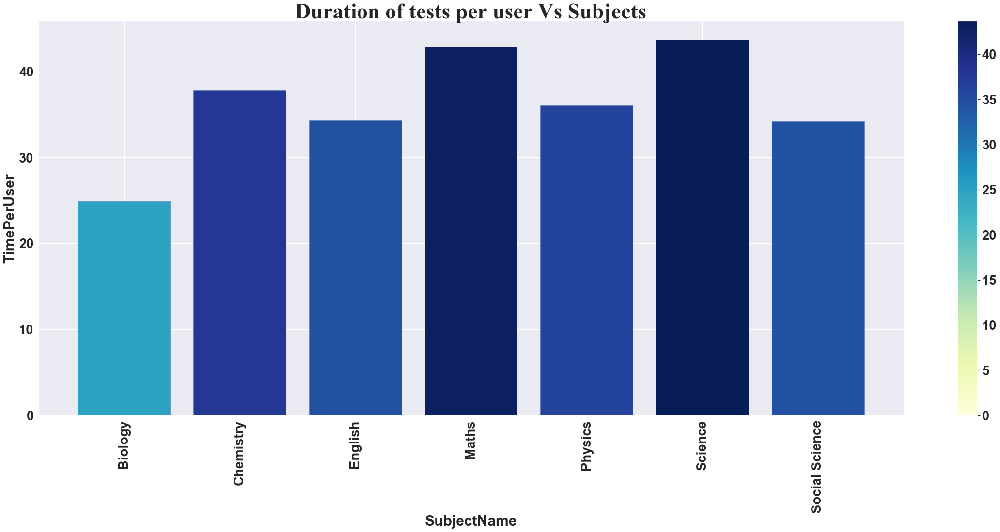

In [33]:
it6 = IT.subjectwise_analysis_3()

## Affiliation-wise test analysis

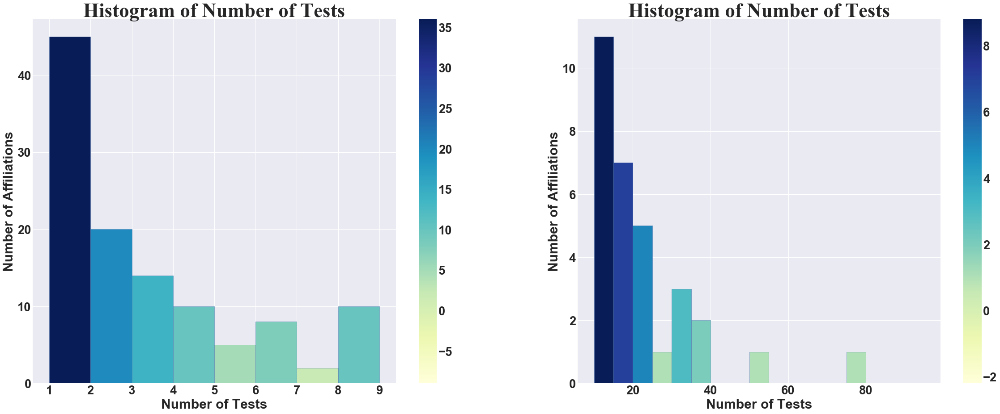

In [34]:
it7 = IT.affiliationwise_analysis()

## Daily Trend

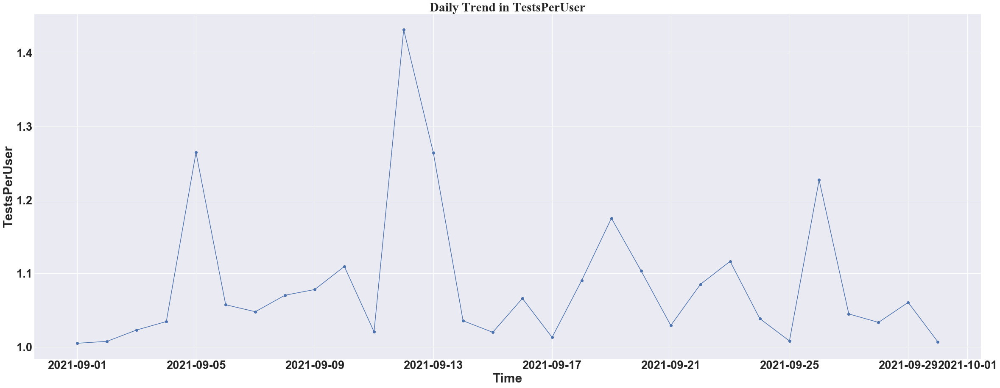

In [35]:
it8 = IT.daily_trend_1()

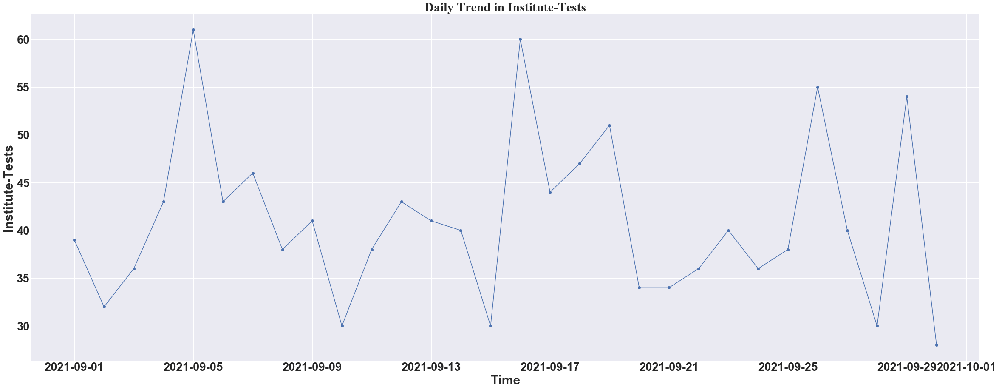

In [36]:
it9 = IT.daily_trend_2()

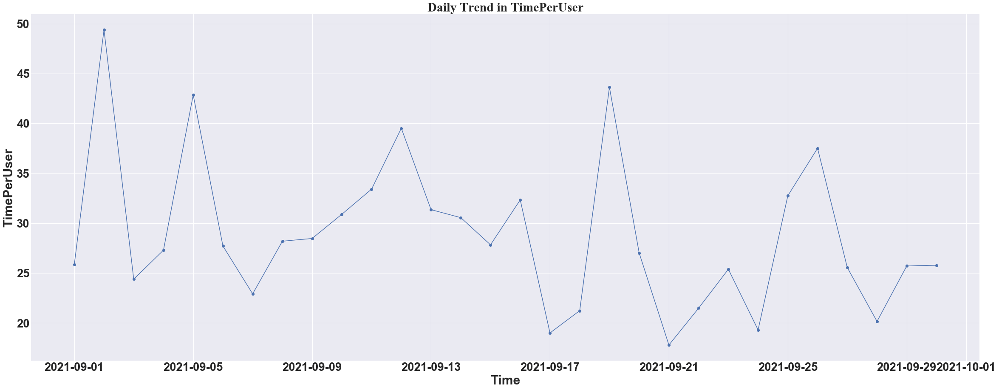

In [37]:
it10 = IT.daily_trend_3()

## Weekly Trend

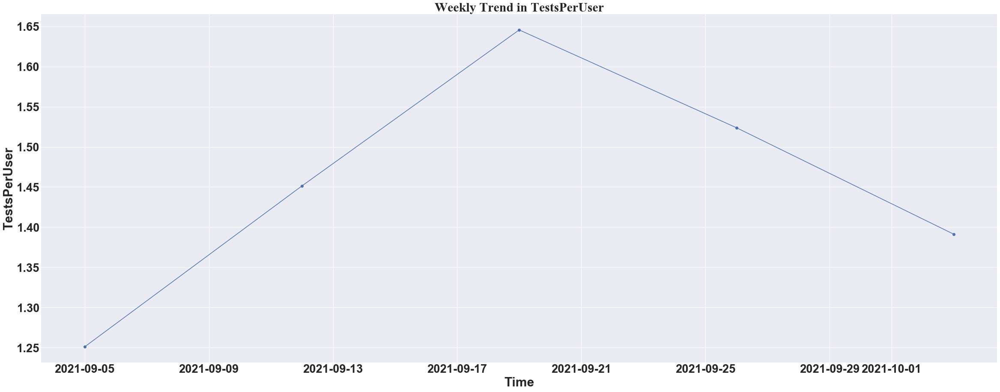

In [38]:
it11 = IT.weekly_trend_1()

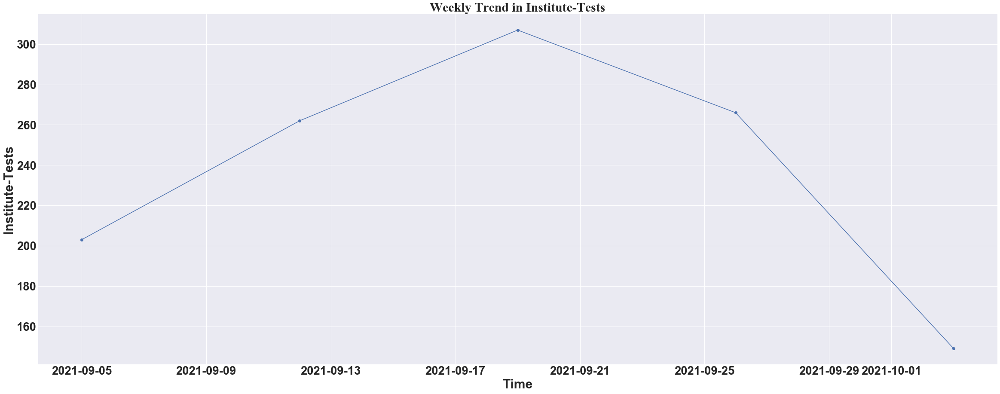

In [39]:
it12 = IT.weekly_trend_2()

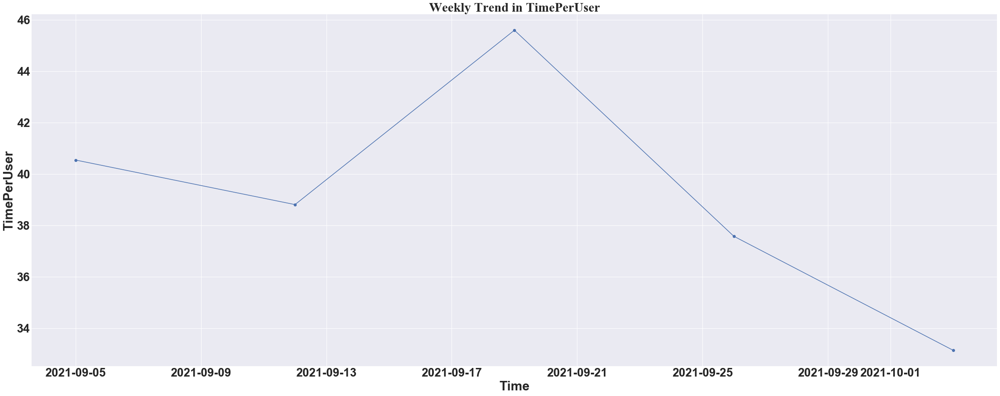

In [40]:
it13 = IT.weekly_trend_3()

## Monthly Trend

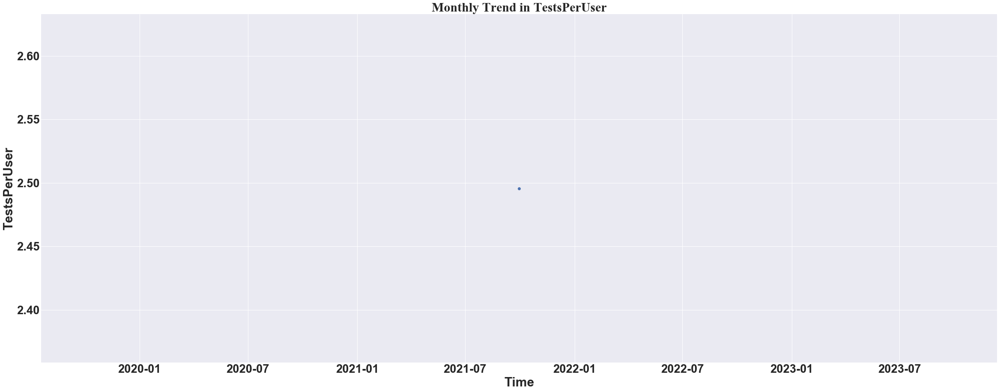

In [41]:
it14 = IT.monthly_trend_1()

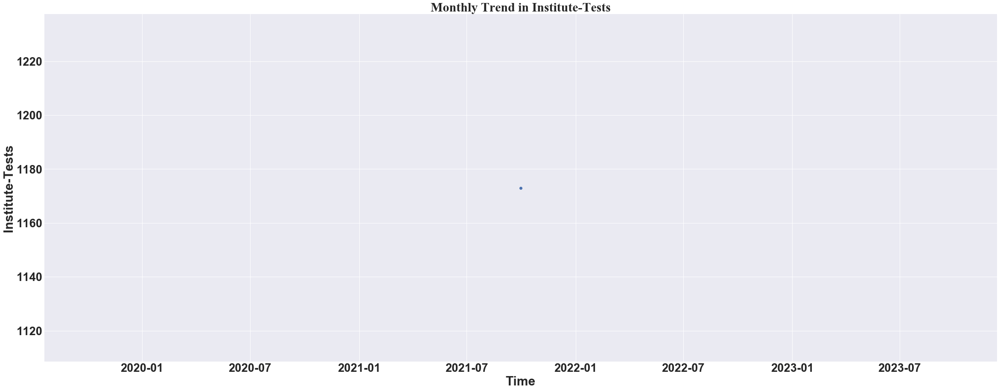

In [42]:
it15 = IT.monthly_trend_2()

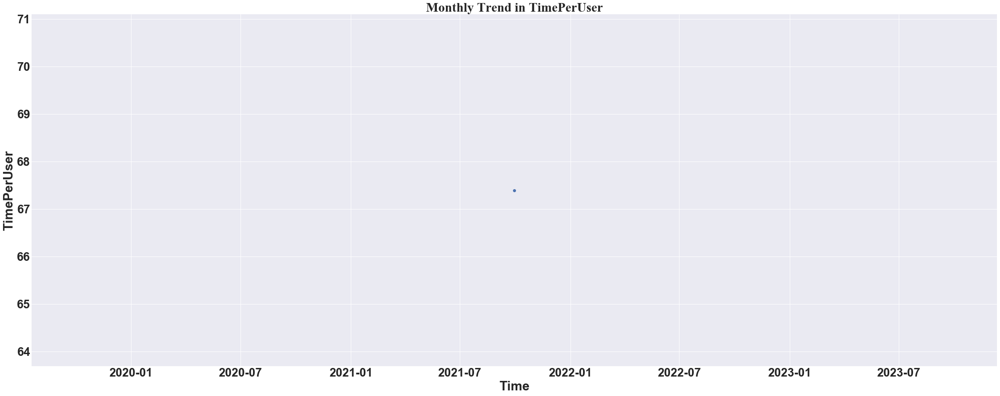

In [43]:
it16 = IT.monthly_trend_3()

## Quarterly Trend

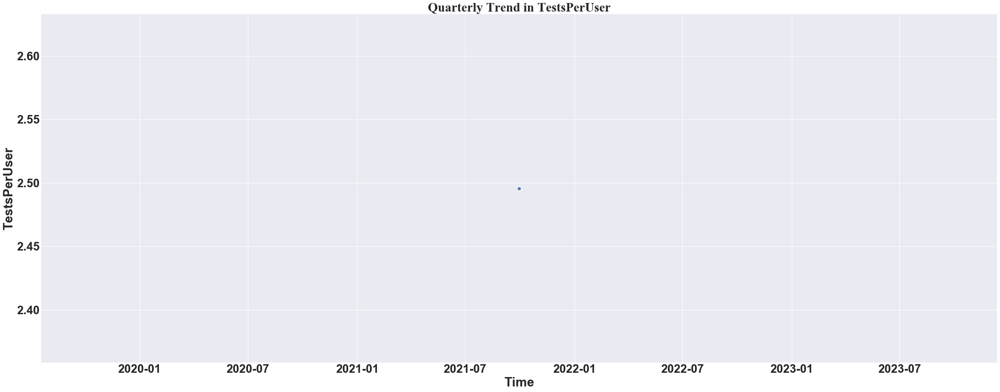

In [44]:
it17 = IT.quarterly_trend_1()

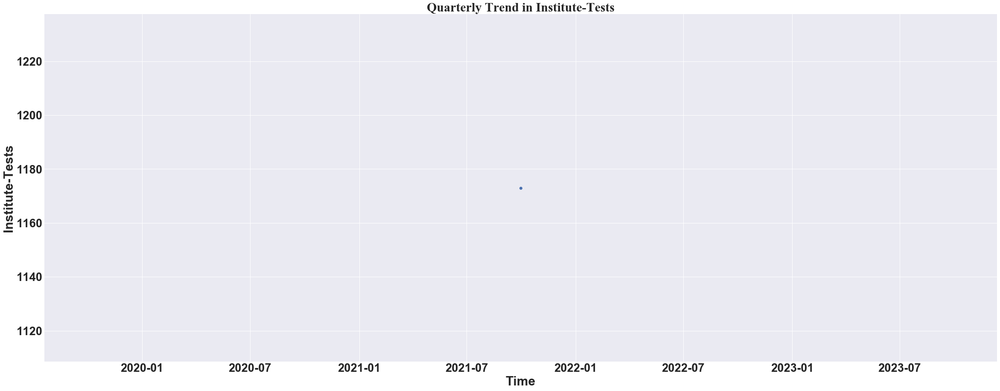

In [45]:
it18 = IT.quarterly_trend_2()

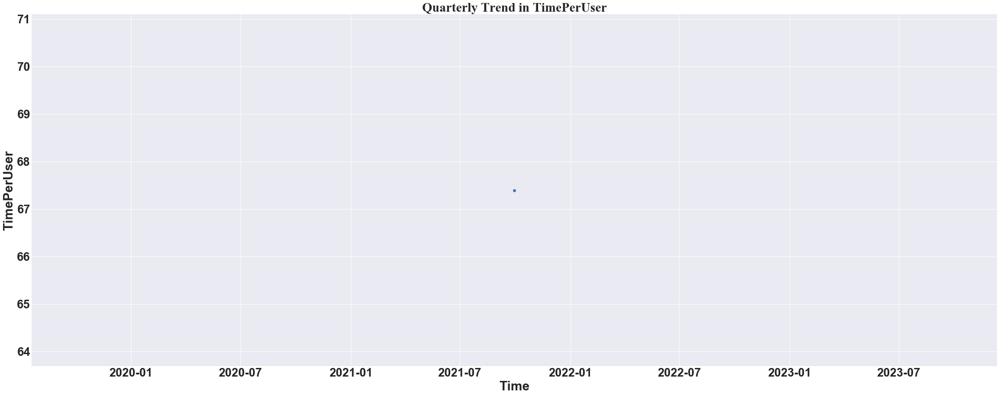

In [46]:
it19 = IT.quarterly_trend_3()

## Yearly Trend

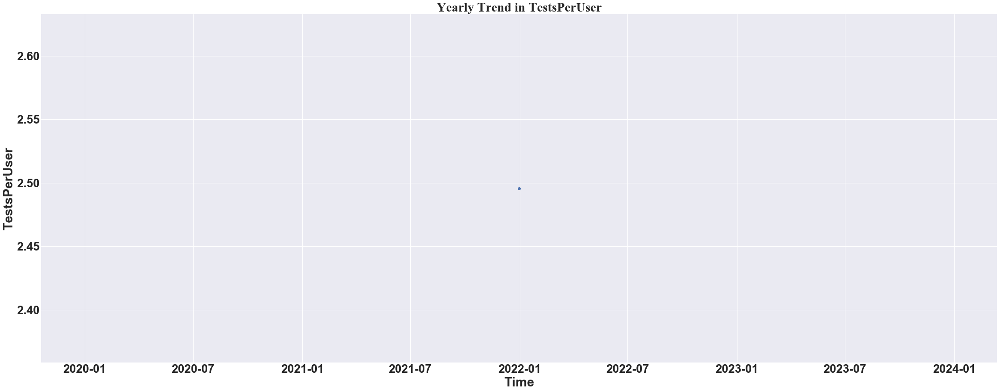

In [47]:
it20 = IT.yearly_trend_1()

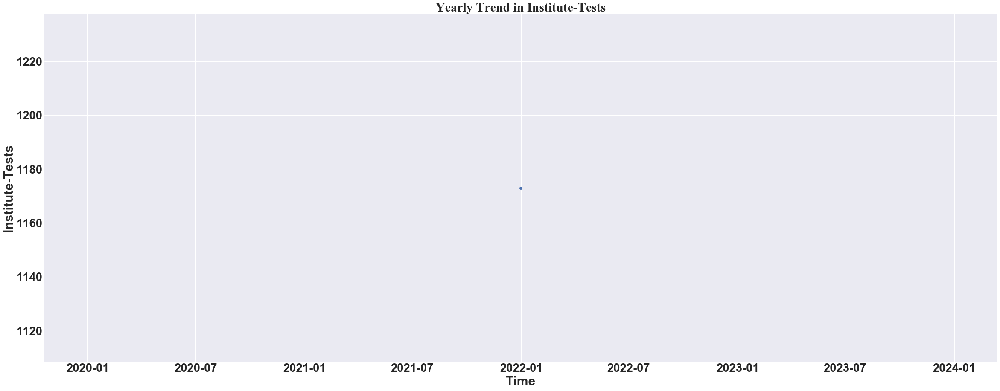

In [48]:
it21 = IT.yearly_trend_2()

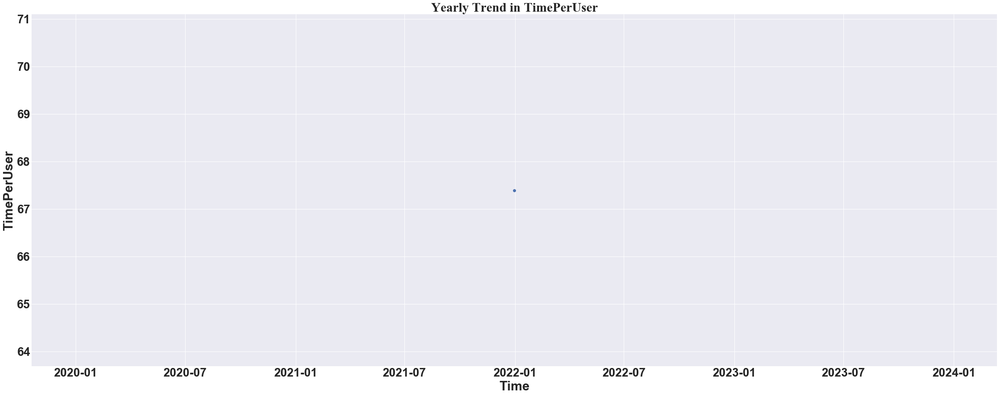

In [49]:
it22 = IT.yearly_trend_3()

# 4. Self Test Usage

In [50]:
ST = Self_Test_Usage(conn, start_date, end_date)

Length of data is: 2054206


,index,UserTestSessionId,UserId,QuestionId,IsAttempted,TimeTakenTillSubmission,StartedOn,CompletedOn,AttemptedOn,CourseId,SubjectId,AffiliationCodeId,CenterCodeId,RoleId,CourseName,SubjectName
0,0,552668,132833,29615,1,5,2021-09-01 00:54:36.247,2021-09-01 00:54:45.977,2021-09-01 00:54:41.857,1,1,1814,7772,2,JEE,Physics
1,1,550867,105219,109033,1,3,2021-09-01 00:20:45.297,2021-09-01 00:21:51.633,2021-09-01 00:20:48.413,6,3,903,3366,2,NEET,Chemistry
2,2,553292,131247,23319,1,88,2021-08-31 23:58:32.547,2021-09-01 00:01:38.400,2021-09-01 00:00:00.020,1,2,1752,7191,2,JEE,Maths
3,3,553293,85577,129273,1,241,2021-08-31 23:58:58.667,2021-09-01 00:03:25.363,2021-09-01 00:02:59.503,1,2,18,8314,2,JEE,Maths
4,4,553287,132565,202852,1,138,2021-08-31 23:59:04.033,2021-09-01 00:01:29.327,2021-09-01 00:01:22.947,4,3,1839,7666,2,11/12 CBSE,Chemistry


## Course-wise test analysis

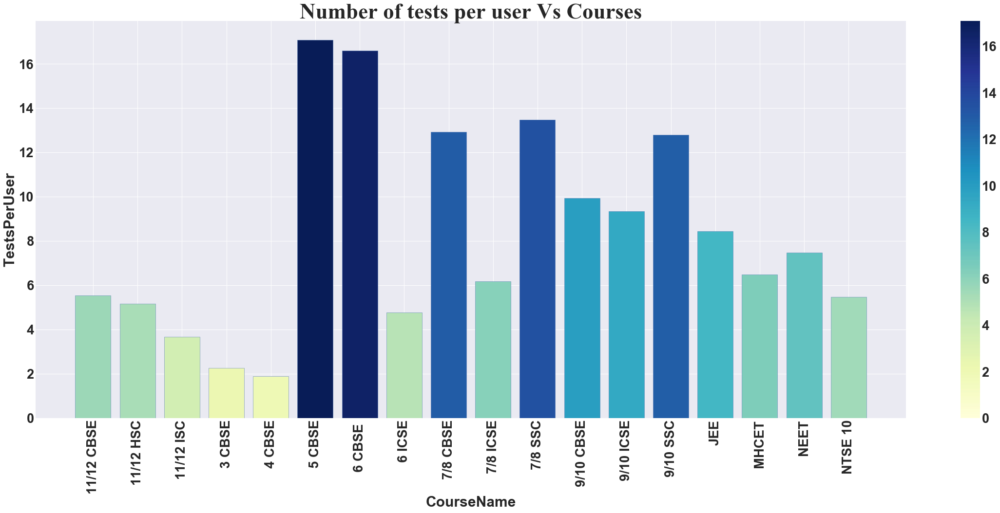

In [51]:
st1 = ST.coursewise_analysis_1()

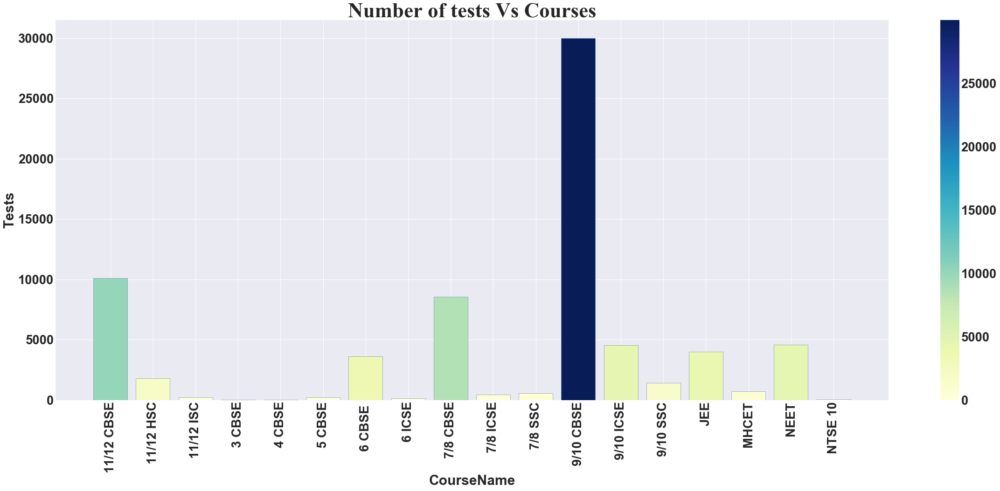

In [52]:
st2 = ST.coursewise_analysis_2()

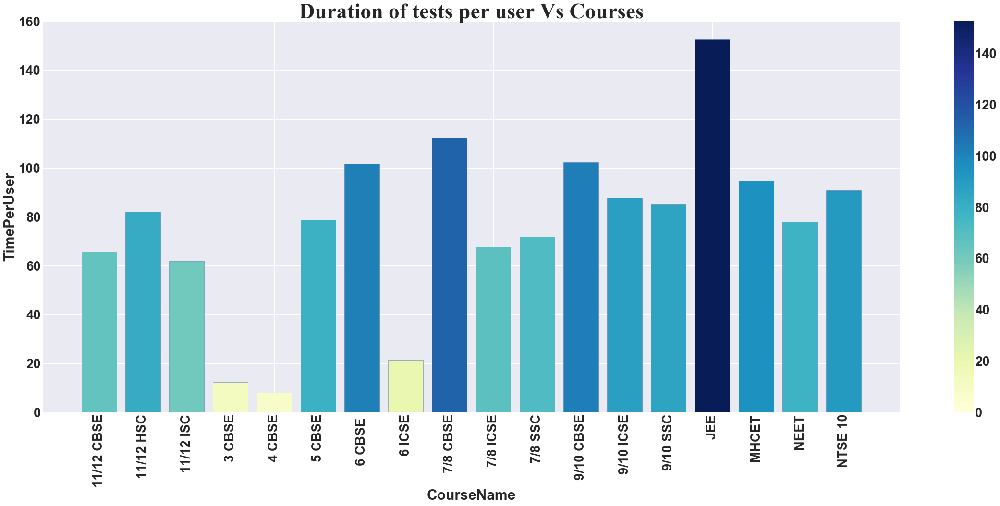

In [53]:
st3 = ST.coursewise_analysis_3()

## Subject-wise test analysis

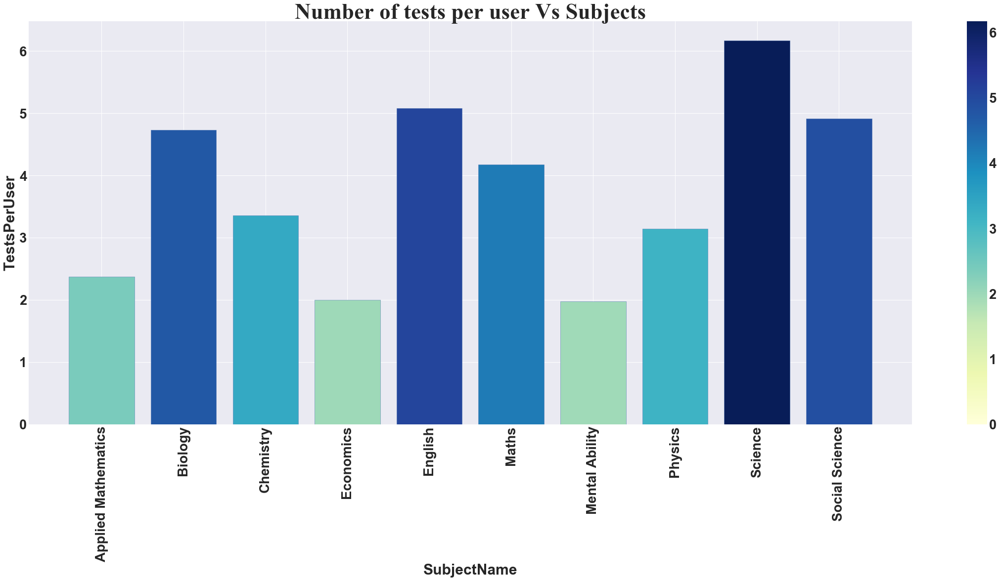

In [54]:
st4 = ST.subjectwise_analysis_1()

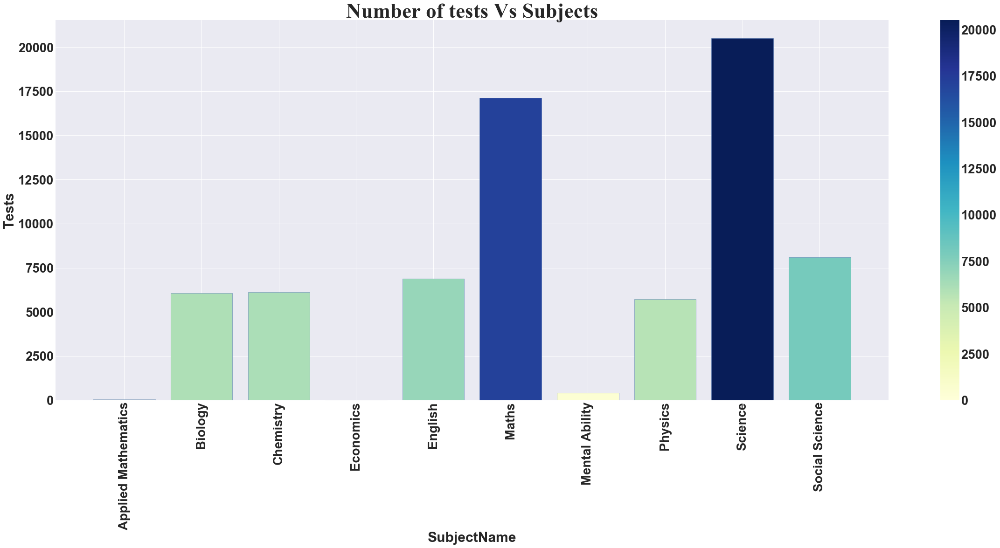

In [55]:
st5 = ST.subjectwise_analysis_2()

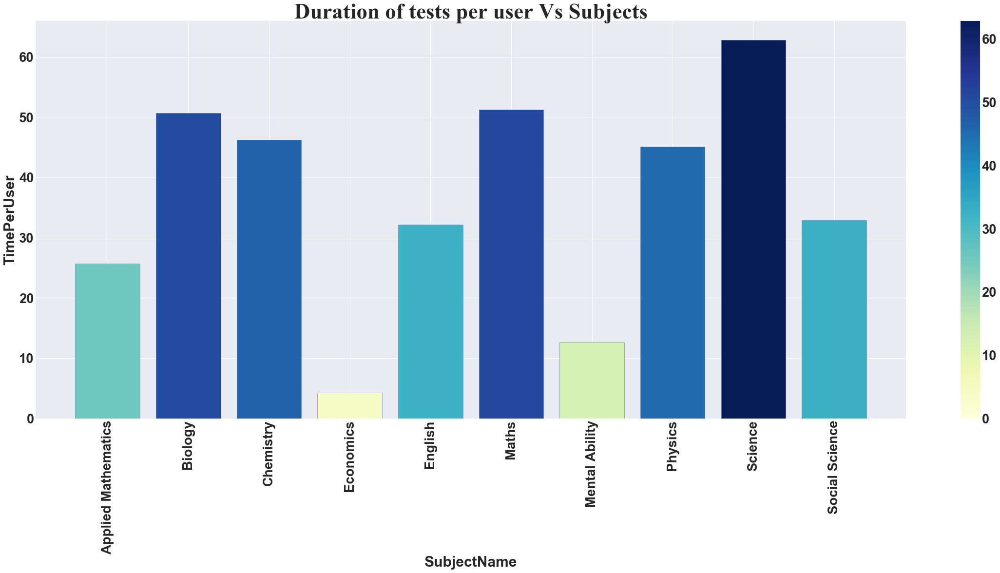

In [56]:
st6 = ST.subjectwise_analysis_3()

## Affiliation-wise test analysis

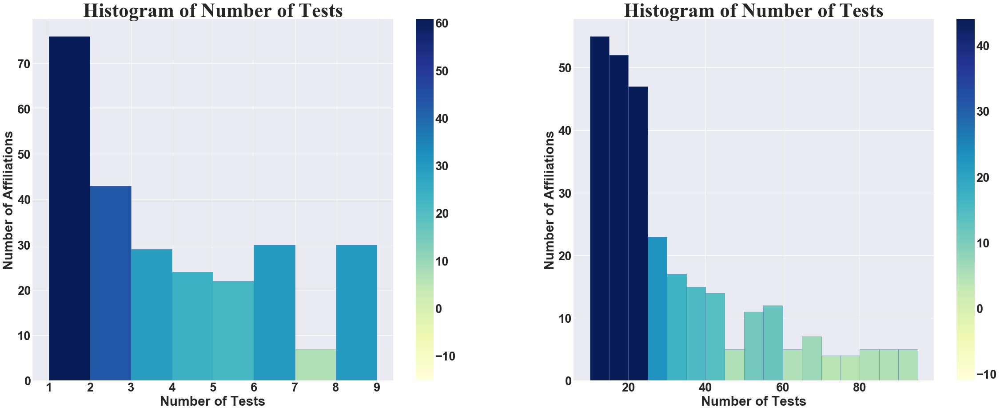

In [57]:
st7 = ST.affiliationwise_analysis()

## Daily Trend

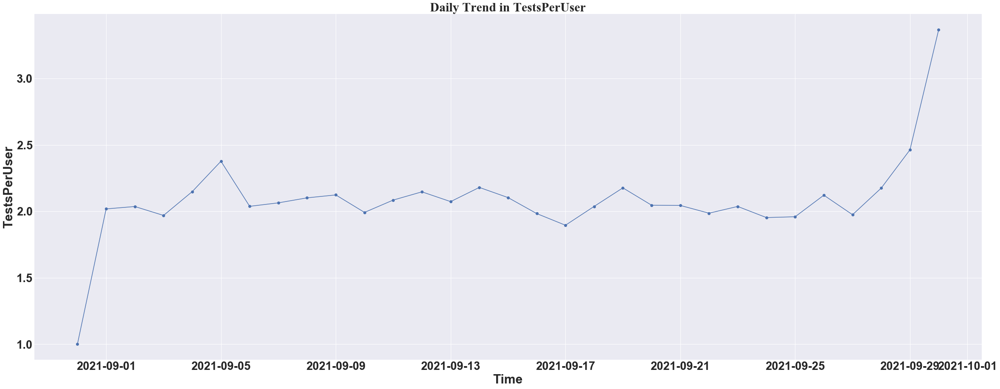

In [58]:
st8 = ST.daily_trend_1()

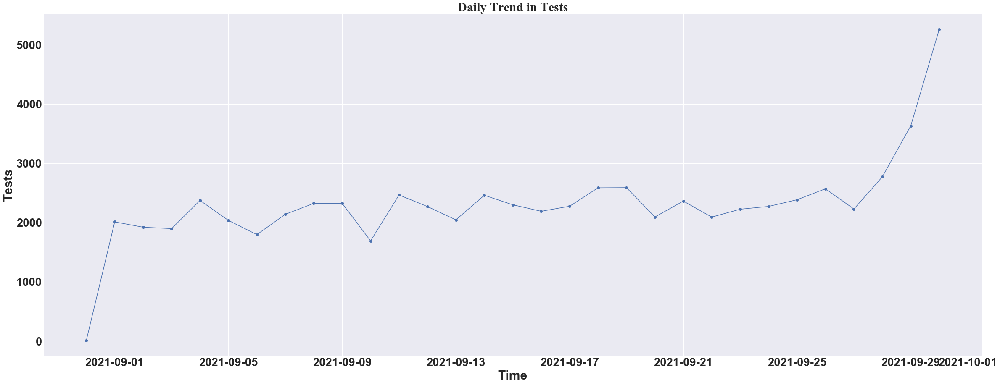

In [59]:
st9 = ST.daily_trend_2()

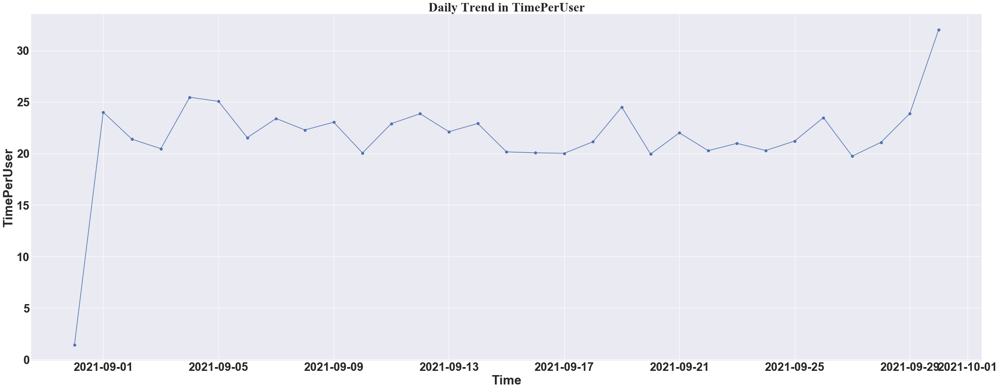

In [60]:
st10 = ST.daily_trend_3()

## Weekly Trend

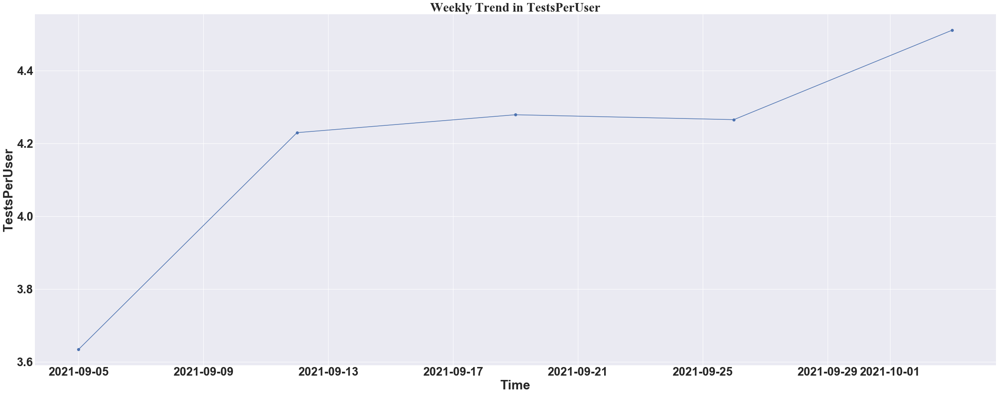

In [61]:
st11 = ST.weekly_trend_1()

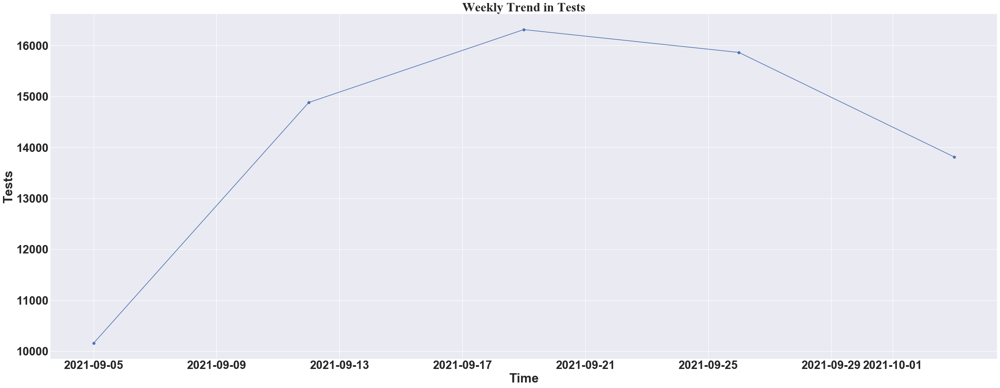

In [62]:
st12 = ST.weekly_trend_2()

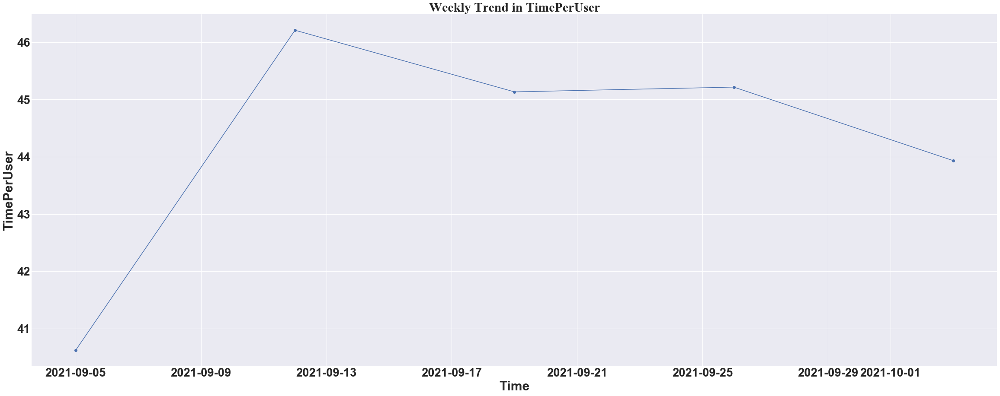

In [63]:
st13 = ST.weekly_trend_3()

## Monthly Trend

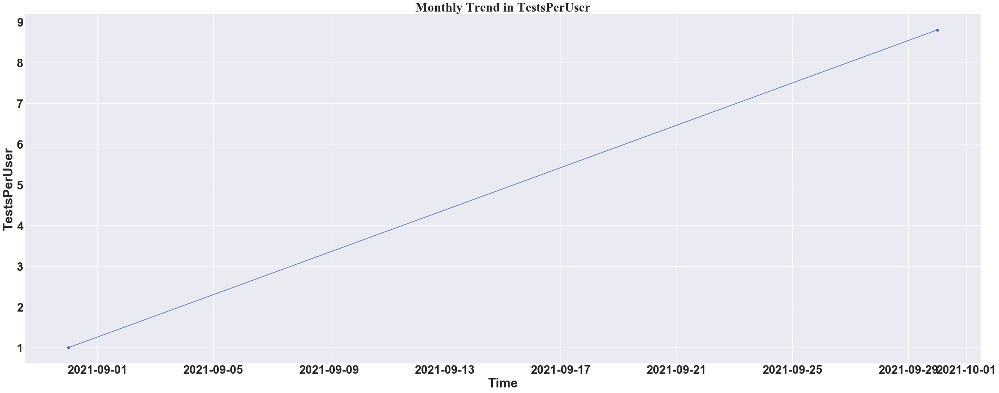

In [64]:
st14 = ST.monthly_trend_1()

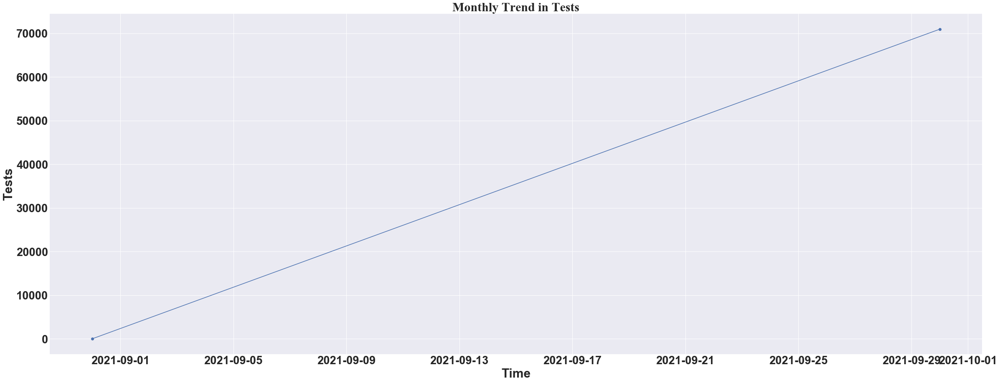

In [65]:
st15 = ST.monthly_trend_2()

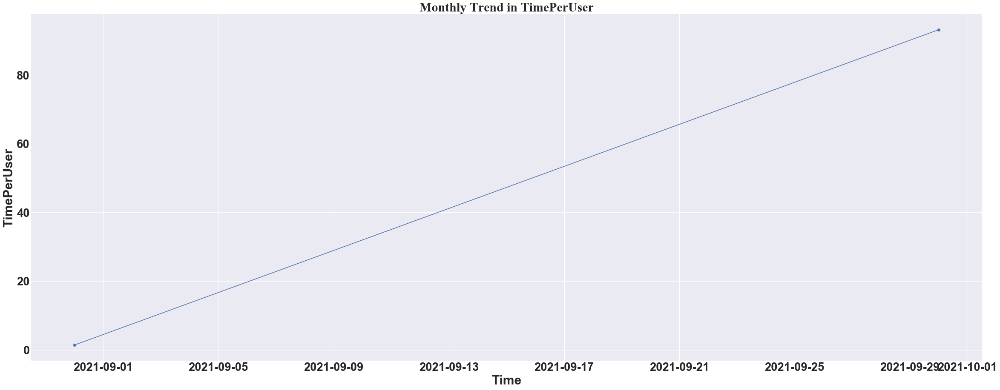

In [66]:
st16 = ST.monthly_trend_3()

## Quarterly Trend

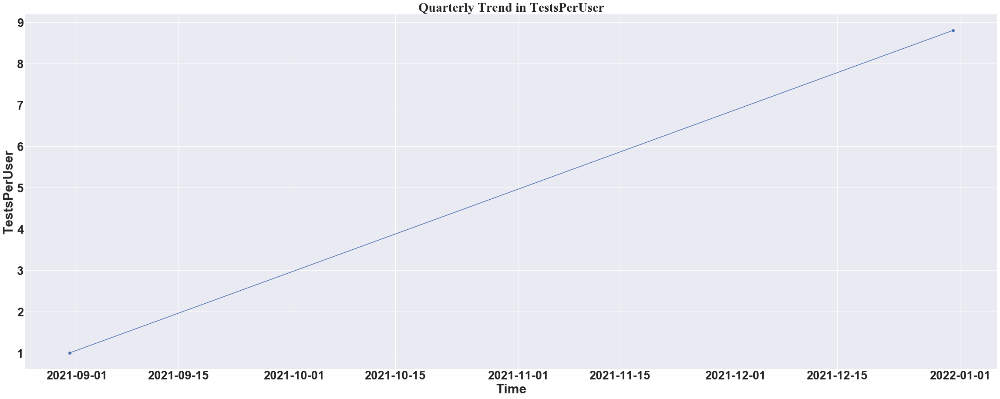

In [67]:
st17 = ST.quarterly_trend_1()

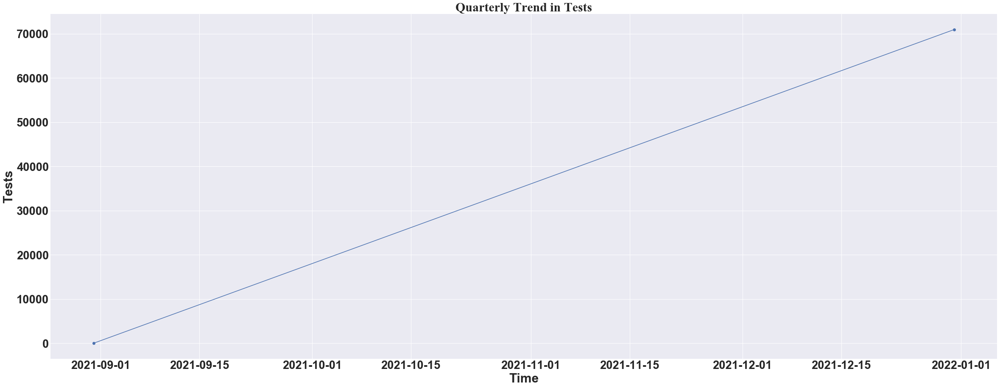

In [68]:
st18 = ST.quarterly_trend_2()

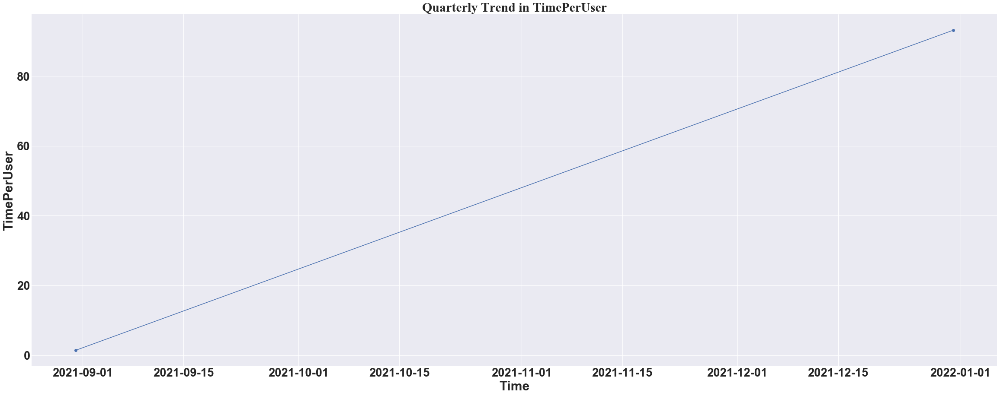

In [69]:
st19 = ST.quarterly_trend_3()

## Yearly Trend

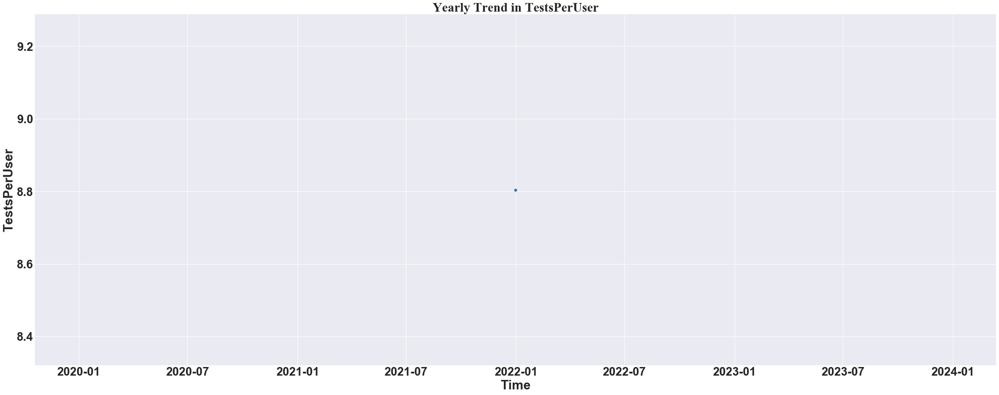

In [70]:
st20 = ST.yearly_trend_1()

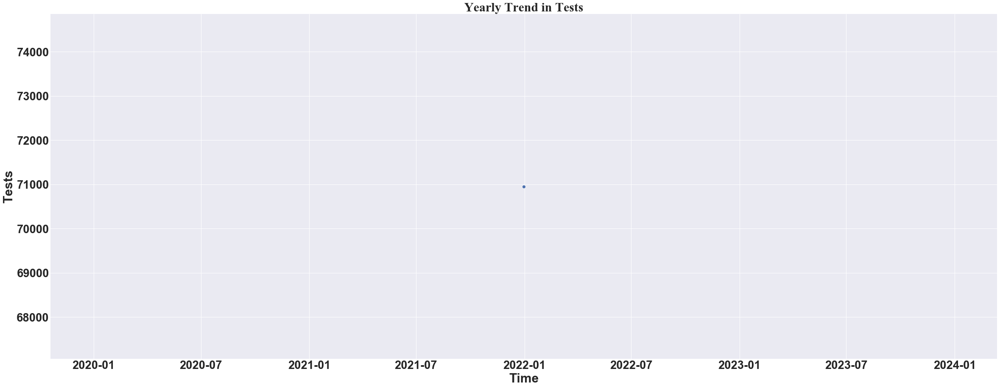

In [71]:
st21 = ST.yearly_trend_2()

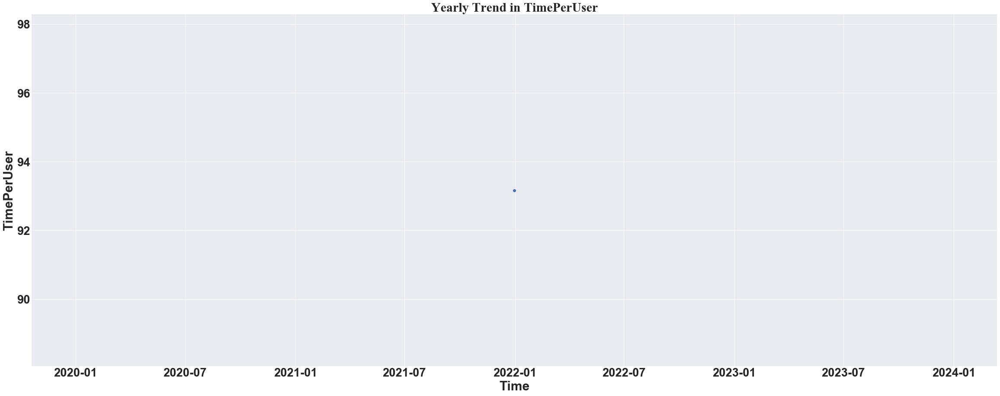

In [72]:
st22 = ST.yearly_trend_3()

# 5. Learn Usage

In [73]:
LU = Learn_Usage(conn, start_date, end_date)

Length of data is: 3346


,OnlineClassId,AffiliationId,CourseId,SubjectId,StartTime,Duration,CourseName,SubjectName
0,132,1291,2,2,2021-09-02 12:25:00,55,9/10 CBSE,Maths
1,222,1136,2,4,2021-09-07 15:18:00,45,9/10 CBSE,Science
2,230,1136,15,4,2021-09-07 16:00:00,60,9/10 SSC,Science
3,233,1136,2,4,2021-09-07 17:00:00,60,9/10 CBSE,Science
4,240,1136,2,4,2021-09-07 18:00:00,60,9/10 CBSE,Science


## Course-wise test analysis

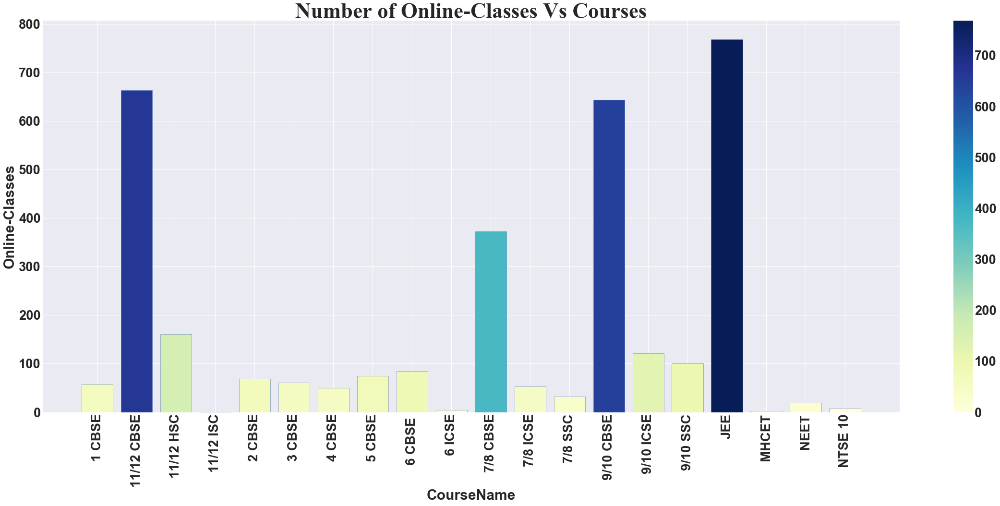

In [74]:
lu1 = LU.coursewise_analysis_1()

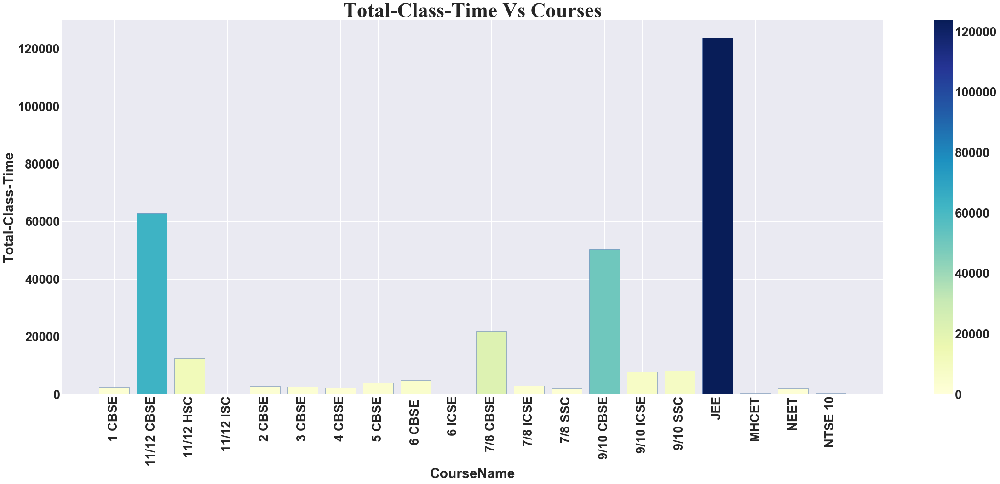

In [75]:
lu2 = LU.coursewise_analysis_2()

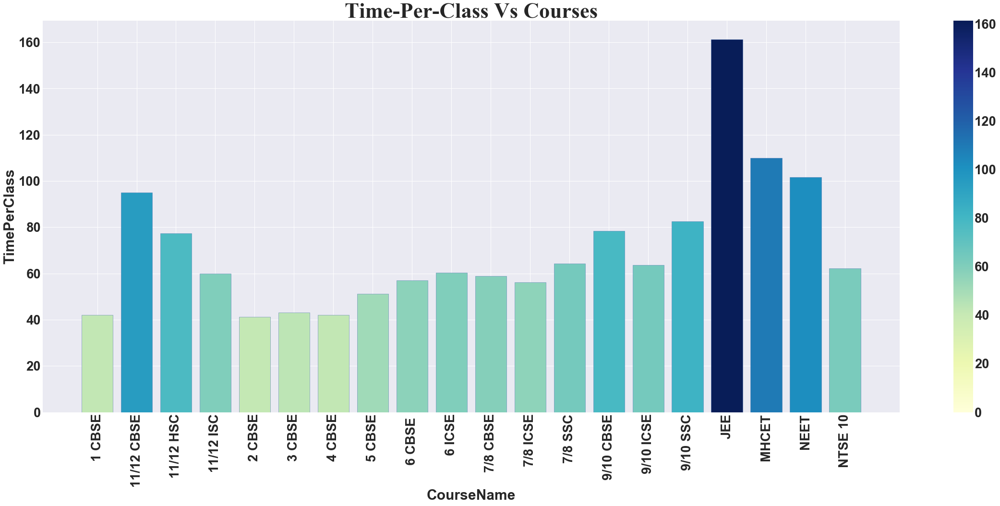

In [76]:
lu3 = LU.coursewise_analysis_3()

## Subject-wise test analysis

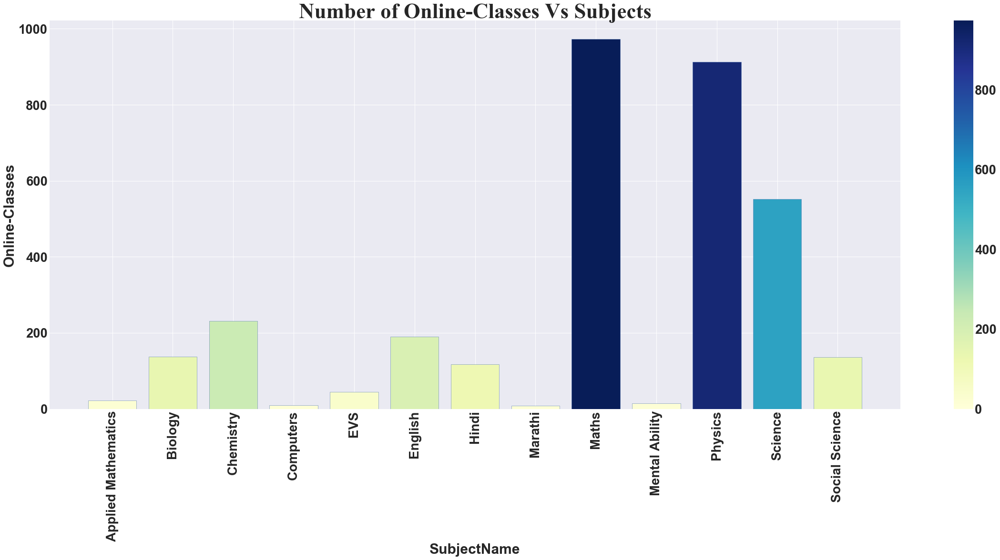

In [77]:
lu4 = LU.subjectwise_analysis_1()

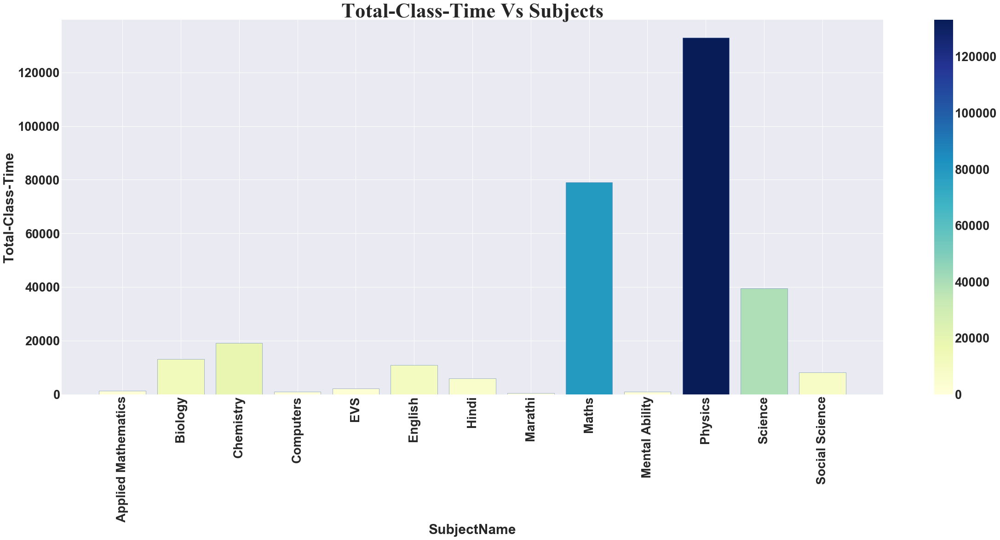

In [78]:
lu5 = LU.subjectwise_analysis_2()

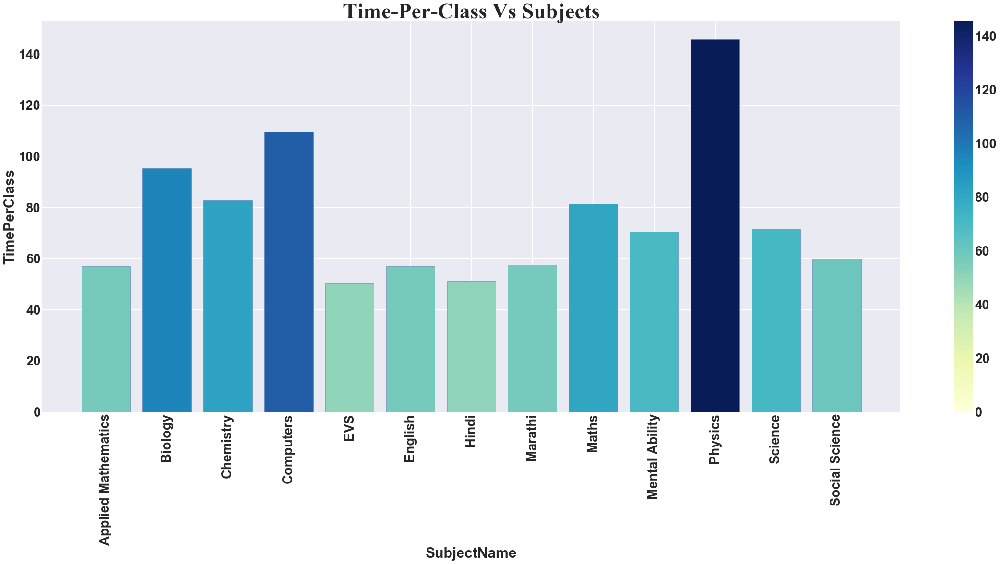

In [79]:
lu6 = LU.subjectwise_analysis_3()

## Affiliation-wise test analysis

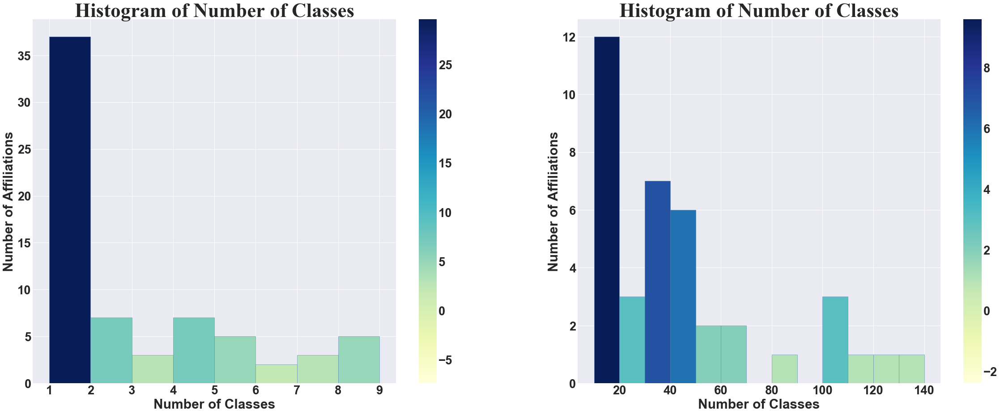

In [80]:
lu7 = LU.affiliationwise_analysis()

## Daily Trend

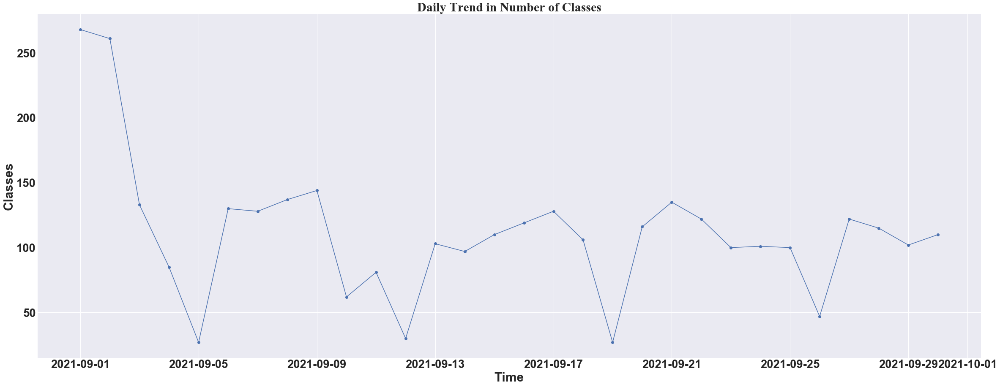

In [81]:
lu8 = LU.daily_trend_1()

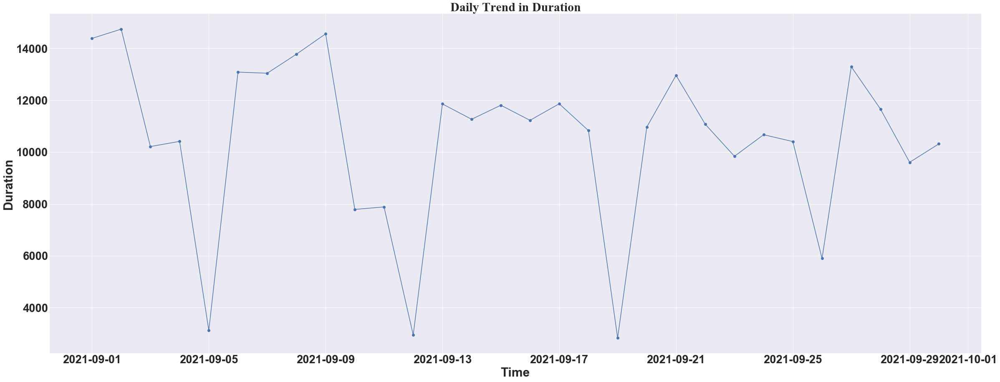

In [82]:
lu9 = LU.daily_trend_2()

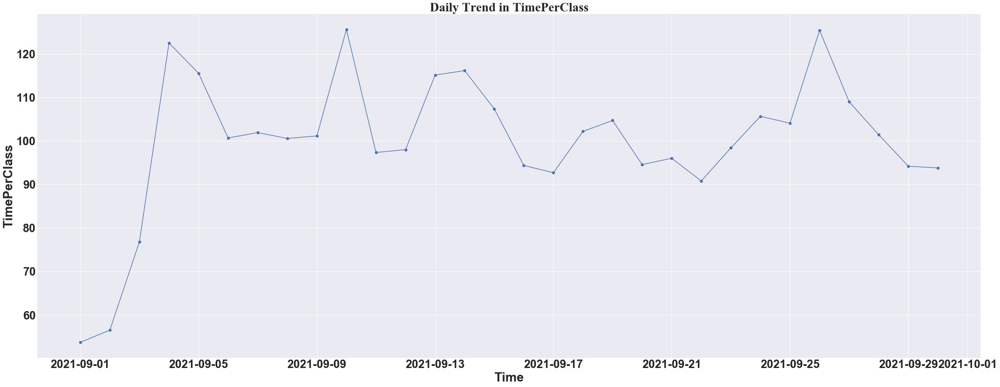

In [83]:
lu10 = LU.daily_trend_3()

## Weekly Trend

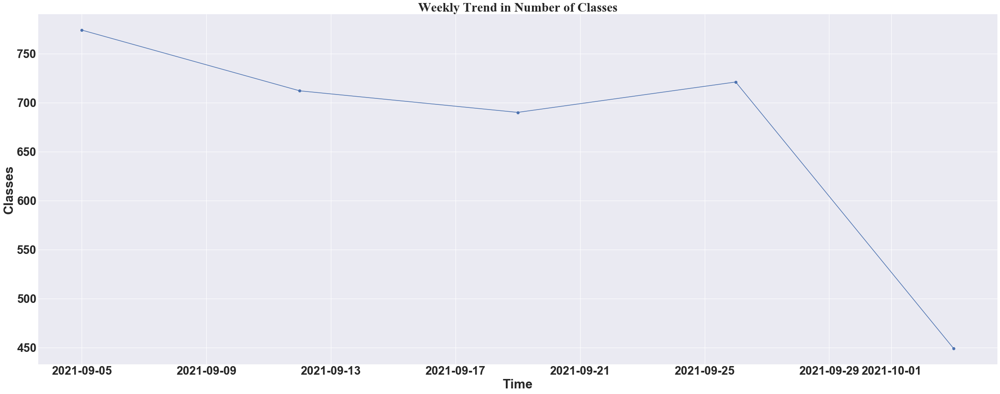

In [84]:
lu11 = LU.weekly_trend_1()

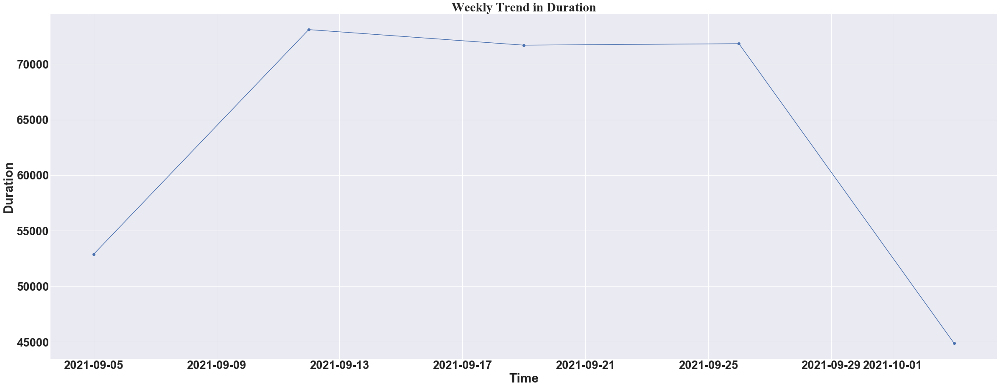

In [85]:
lu12 = LU.weekly_trend_2()

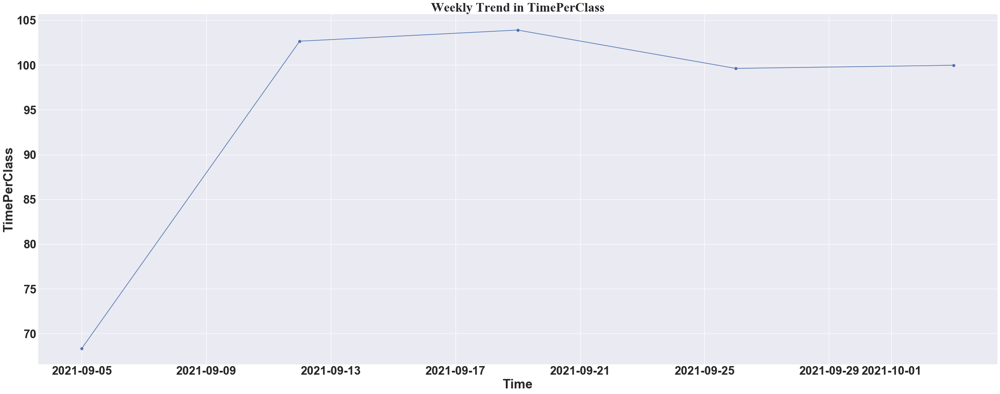

In [86]:
lu13 = LU.weekly_trend_3()

## Monthly Trend

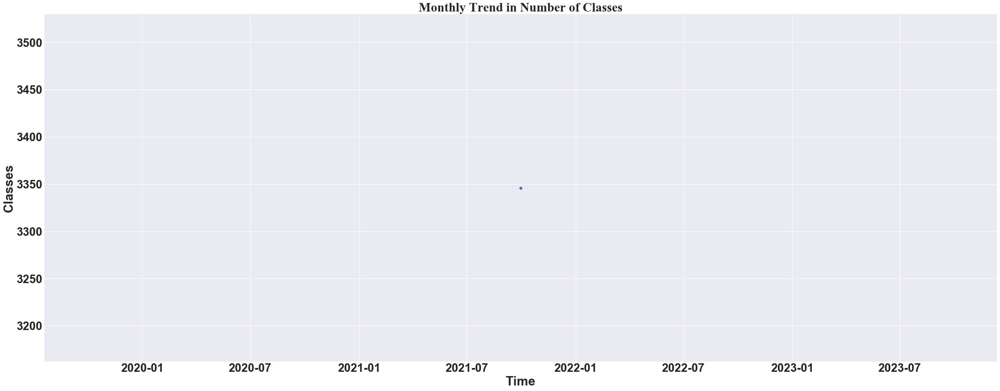

In [87]:
lu14 = LU.monthly_trend_1()

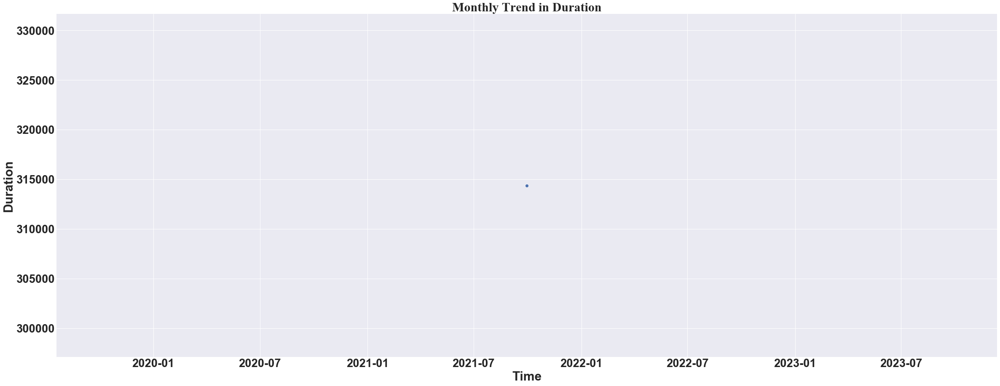

In [88]:
lu15 = LU.monthly_trend_2()

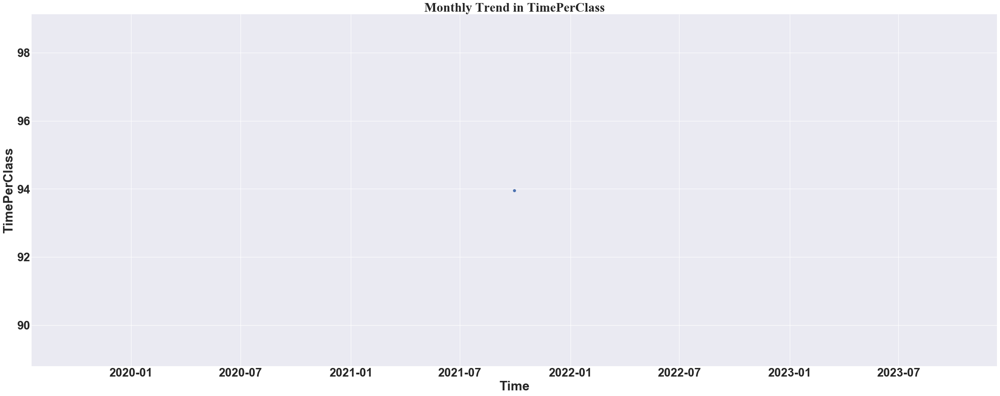

In [89]:
lu16 = LU.monthly_trend_3()

## Quarterly Trend

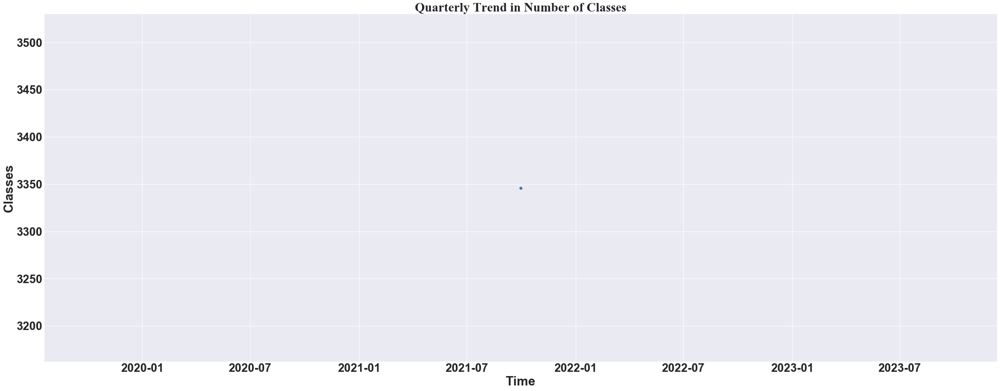

In [90]:
lu17 = LU.quarterly_trend_1()

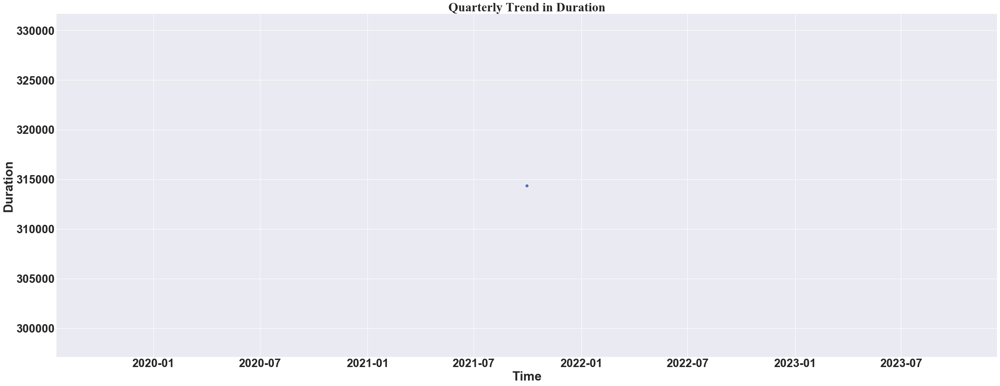

In [91]:
lu18 = LU.quarterly_trend_2()

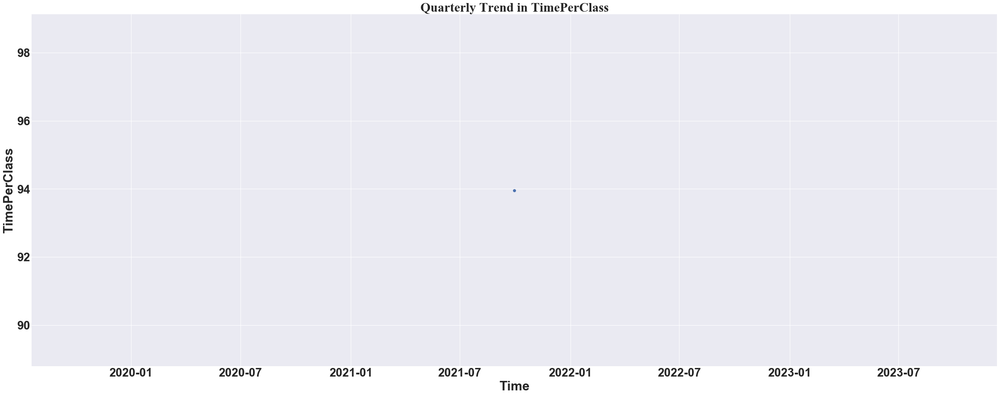

In [92]:
lu19 = LU.quarterly_trend_3()

## Yearly Trend

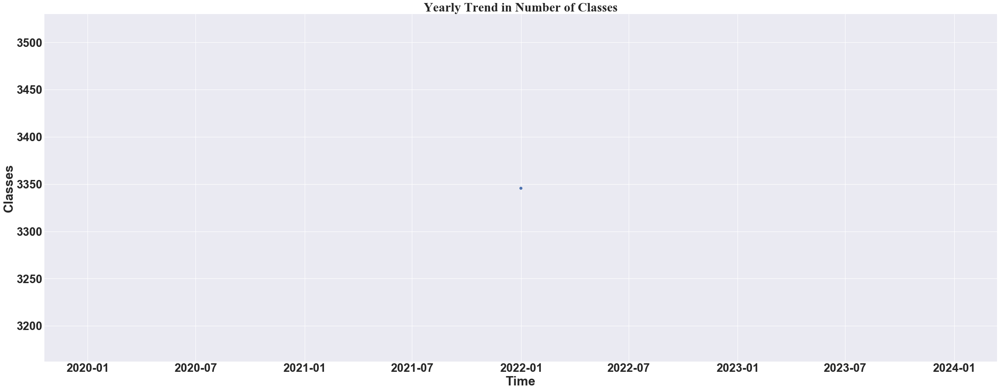

In [93]:
lu20 = LU.yearly_trend_1()

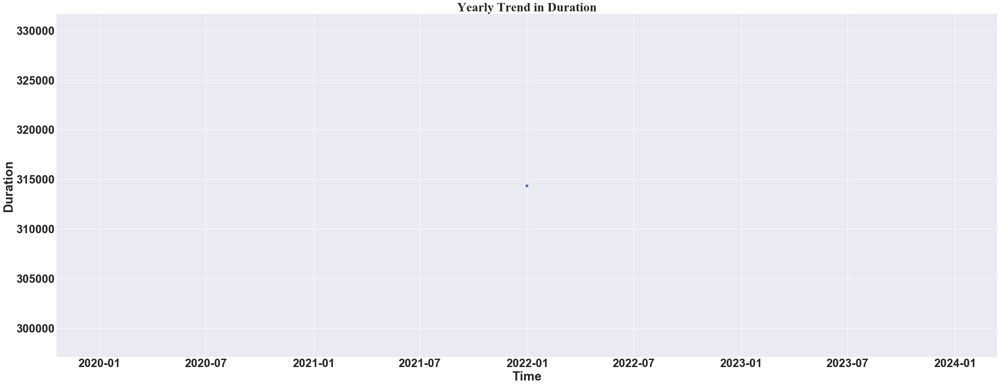

In [94]:
lu21 = LU.yearly_trend_2()

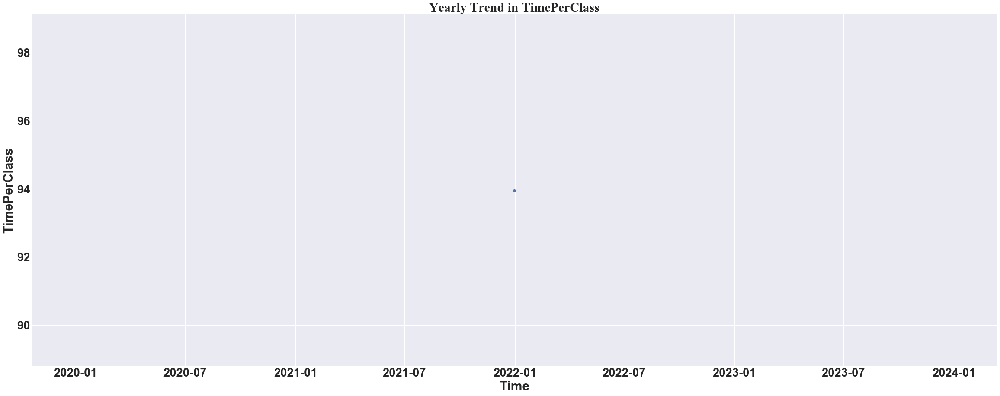

In [95]:
lu22 = LU.yearly_trend_3()